Program that extracts the information about the position and velocity of atoms in each sites along with charge and charge velocity at those sites in each frames.


path="" refers to the path of the dump file from which data is to be extracted

frames=------ number of frames during openmd execution

atomNumber=----------- total number of atomic sites during program execution

In [1]:
# extract information from dump file.
import numpy as num
import matplotlib.pyplot as plt
from matplotlib import use
import pylab as lab
from scipy import constants
from matplotlib import rcParams
import os

from scipy.optimize import curve_fit

os.chdir("/home/hbhattar/afs/Hemanta/metals/pythonScripts/function")

import FDEAM as feam

os.chdir("/home/hbhattar/afs/Hemanta/metals/pythonScripts/")



#setting different parameteres
params = {
    'font.family':'serif',
   'axes.labelsize': 12,
   'font.size': 12,
   'legend.fontsize': 12,
   'xtick.labelsize': 12,
   'ytick.labelsize': 12,
    'axes.labelpad' : 0,
   'text.usetex': False,
   'figure.figsize': [4,4],
    'figure.max_open_warning': 0
   }
rcParams.update(params)
%matplotlib inline




In [22]:
#Write the information about outer layers and the charge and z gradient wrt number of layers


KET=[[k,e,t] for k in range(10,27,2) for e in [0.1,0.2,0.3] for t in range(9,41,3)]
fileName=[]
for info in [[10,1,9]]:
    fileName.append("PtSlab111Z"+str(info[2])+"K_"+str(info[0])+"E_"+str(info[1])+".dump")
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}

frames=100
for info in KET:
    file="PtSlab111Z"+str(info[2])+"K_"+str(info[0])+"E_"+str(info[1])+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,100,nMol[str(info[2])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,atoms)
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue;
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    
    const=num.polyfit(zav[3:-3],chav[3:-3],1)
    dat=[]
    print("Writing::: K:%f  E:%  T:%f"%(info[0],info[1],info[2]))
    fileData=open("../KTuning/Results/ZSlopeResultK_"+str(info[0])+"E_"+str(info[1])+".dat","a+")
    fileData.write(str(info[2]))
    for var in zav[:3]:
        fileData.write("\t")
        fileData.write(str(var))
    for var in zav[-3:]:
        fileData.write("\t")
        fileData.write(str(var))
    for var in chav[:3]:
        fileData.write("\t")
        fileData.write(str(var))
    for var in chav[-3:]:
        fileData.write("\t")
        fileData.write(str(var))
    fileData.write("\t")
    fileData.write(str(const[0]))
    fileData.write("\n")
    fileData.close()
    

In [ ]:
KET=[[k,e,t] for k in range(10,25) for e in [3] for t in [9,12,15,18,21,24,27,30,33,36,39]]
frames=100
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}

for info in KET:
    file="PtSlab111Z24"+"K_"+str(info[0])+"E_"+str(info[1])+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(info[2])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,2000)
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue;
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    
    const=num.polyfit(zav[3:-3],chav[3:-3],1)
    dat=[]
    print("Writing::: K:%f  E:%f"%(info[0],info[1]))
    fileData=open("../KTuning/Results/SlopeK_"+str(info[0])+".dat","a+")
    fileData.write(str(info[1]))
    fileData.write("\t")
    fileData.write(str(const[0]))
    fileData.write("\n")
    fileData.close()
    

Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:14.000000  E:1.000000
Writing::: K:14.000000  E:1.000000
Writing::: K:14.000000  E:1.000000
Writing::: K:14.000000  E:1.000000
Writing::: K:14.0000

In [ ]:
KET=[[k,e] for k in range(10,39) for e in [1,3,4,5,6,7,8,9]]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100

for info in KET:
    file="PtSlab111Z24"+"K_"+str(info[0])+"E_"+str(info[1])+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(info[2])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,2000)
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    
    const=num.polyfit(zav[3:-3],chav[3:-3],1)
    dat=[]
    print("Writing::: K:%f  E:%f"%(info[0],info[1]))
    fileData=open("../KTuning/Results/SlopeE_"+str(info[1])+".dat","a+")
    fileData.write(str(info[0]))
    fileData.write("\t")
    fileData.write(str(const[0]))
    fileData.write("\n")
    fileData.close()
    

Writing::: K:10.000000  E:1.000000
Writing::: K:10.000000  E:3.000000
Writing::: K:10.000000  E:4.000000
Writing::: K:10.000000  E:5.000000
Writing::: K:10.000000  E:6.000000
Writing::: K:10.000000  E:7.000000
Writing::: K:10.000000  E:8.000000
Error in reading ../KTuning/Simulation/PtSlab111Z24K_10E_9.dump
Writing::: K:11.000000  E:1.000000
Writing::: K:11.000000  E:3.000000
Writing::: K:11.000000  E:4.000000
Writing::: K:11.000000  E:5.000000
Writing::: K:11.000000  E:6.000000
Writing::: K:11.000000  E:7.000000
Writing::: K:11.000000  E:8.000000
Error in reading ../KTuning/Simulation/PtSlab111Z24K_11E_9.dump
Writing::: K:12.000000  E:1.000000
Writing::: K:12.000000  E:3.000000
Writing::: K:12.000000  E:4.000000
Writing::: K:12.000000  E:5.000000
Writing::: K:12.000000  E:6.000000
Writing::: K:12.000000  E:7.000000
Writing::: K:12.000000  E:8.000000
Writing::: K:12.000000  E:9.000000
Writing::: K:13.000000  E:1.000000
Writing::: K:13.000000  E:3.000000
Writing::: K:13.000000  E:4.0000

=========K:60=====E:0.3=======T:36======

M_qz: 0.000277
M_q: 0.000626
M_z: 2.263794
M_q/M_z: 0.000277




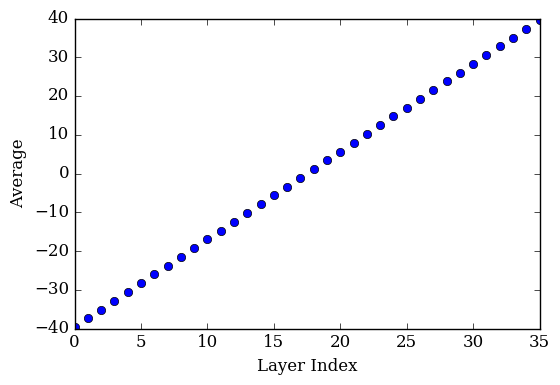

In [4]:
#plot Z and calculate slopes dq/dz dq/dn dz/dn


efield=['0.3']
curvatures=[60]
thickness=[36]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]


for info in KET:
    file="PtSlab111Z"+str(info[2])+'N_4'+"K_"+str(info[0])+"E_"+info[1]+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(info[2])],0)
        
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(info[2])])
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    const0=num.polyfit(zav[3:-3],chav[3:-3],1)
    const1=num.polyfit(range(len(chav[3:-3])),chav[3:-3],1)
    const2=num.polyfit(range(len(zav[3:-3])),zav[3:-3],1)
    print("=========K:%d=====E:%s=======T:%d======\n"%(info[0],info[1],info[2]))
    print("M_qz: %f\nM_q: %f\nM_z: %f\nM_q/M_z: %f\n\n"%(const0[0],const1[0],const2[0],const1[0]/const2[0]))
    lab.plot(zav,'o')
    lab.xlabel("Layer Index")
    lab.ylabel("Average")
    lab.show()
    

Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.01.dump
=========K:1=====E:0.001000=======T:21======

1.12980582414e-23 8.50887490462e-23
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.02.dump
=========K:1=====E:0.002000=======T:21======

8.07568997909e-24 6.08220444096e-23
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.03.dump
=========K:1=====E:0.003000=======T:21======

2.00585972215e-23 1.51089673343e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.04.dump
=========K:1=====E:0.004000=======T:21======

3.1967729131e-23 2.40819617105e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.05.dump
=========K:1=====E:0.005000=======T:21======

2.45991707755e-23 1.8533194965e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_1E_0.06.dump
=========K:1=====E:0.006000=======T:21======

3.71929741623e-23 2.80225636441e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6

=========K:9=====E:0.008000=======T:21======

3.14098285445e-23 2.36731280177e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_9E_0.09.dump
=========K:9=====E:0.009000=======T:21======

3.53024283224e-23 2.6612754266e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_11E_0.01.dump
=========K:11=====E:0.001000=======T:21======

3.74470474597e-24 2.82032090823e-23
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_11E_0.02.dump
=========K:11=====E:0.002000=======T:21======

7.43357316914e-24 5.59875624064e-23
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_11E_0.03.dump
=========K:11=====E:0.003000=======T:21======

1.10945523004e-23 8.35651845168e-23
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_11E_0.04.dump
=========K:11=====E:0.004000=======T:21======

1.49101696723e-23 1.123126813e-22
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_11E_0.05.dump
=========K:11=====E:0.005000=======T:21======

1.857

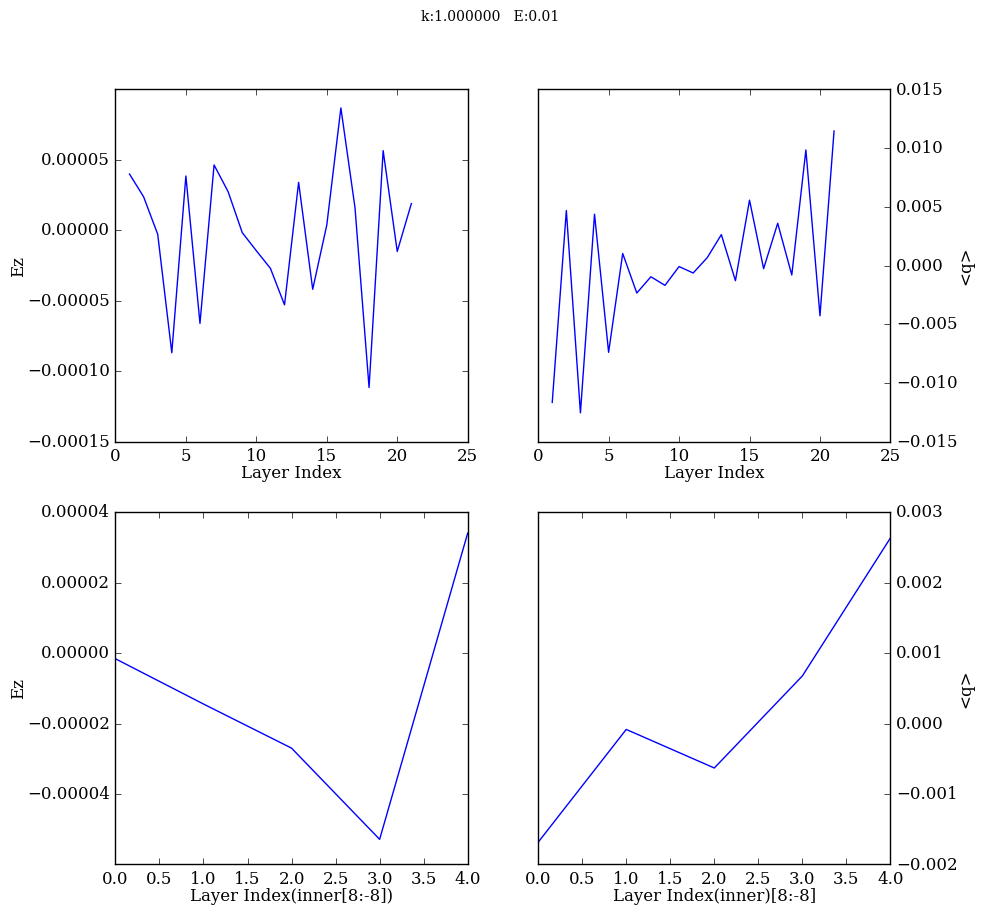

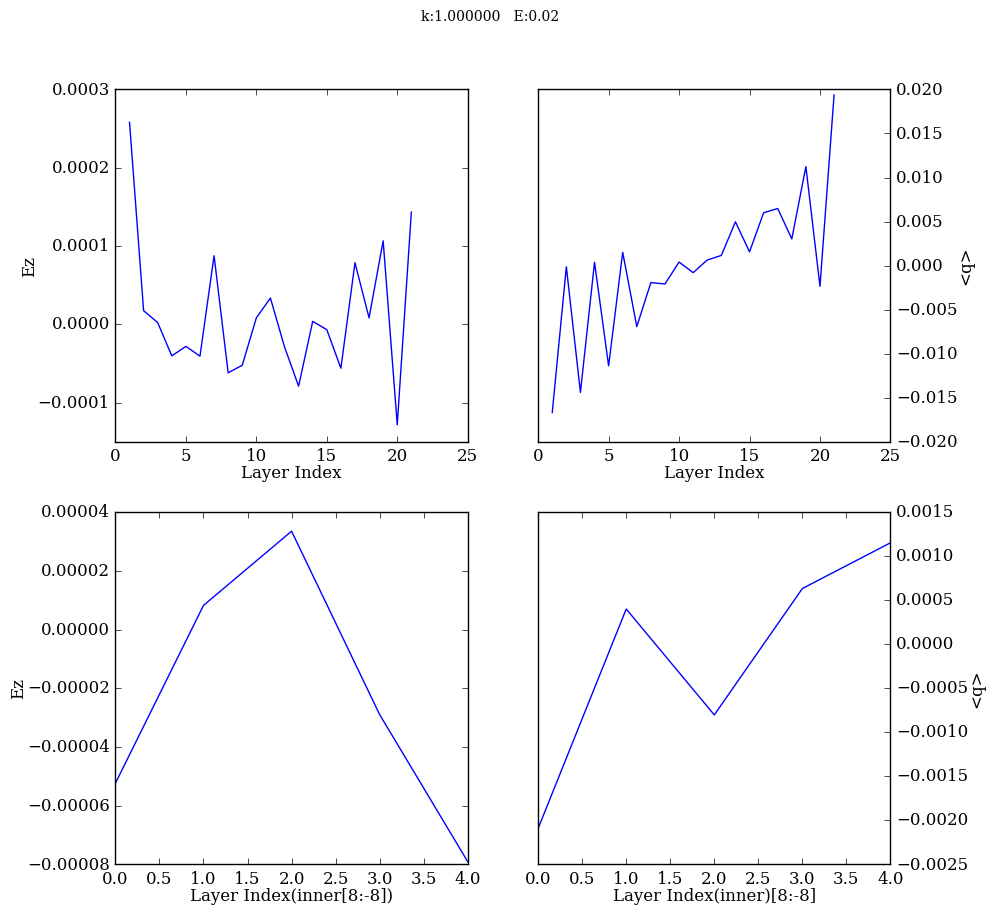

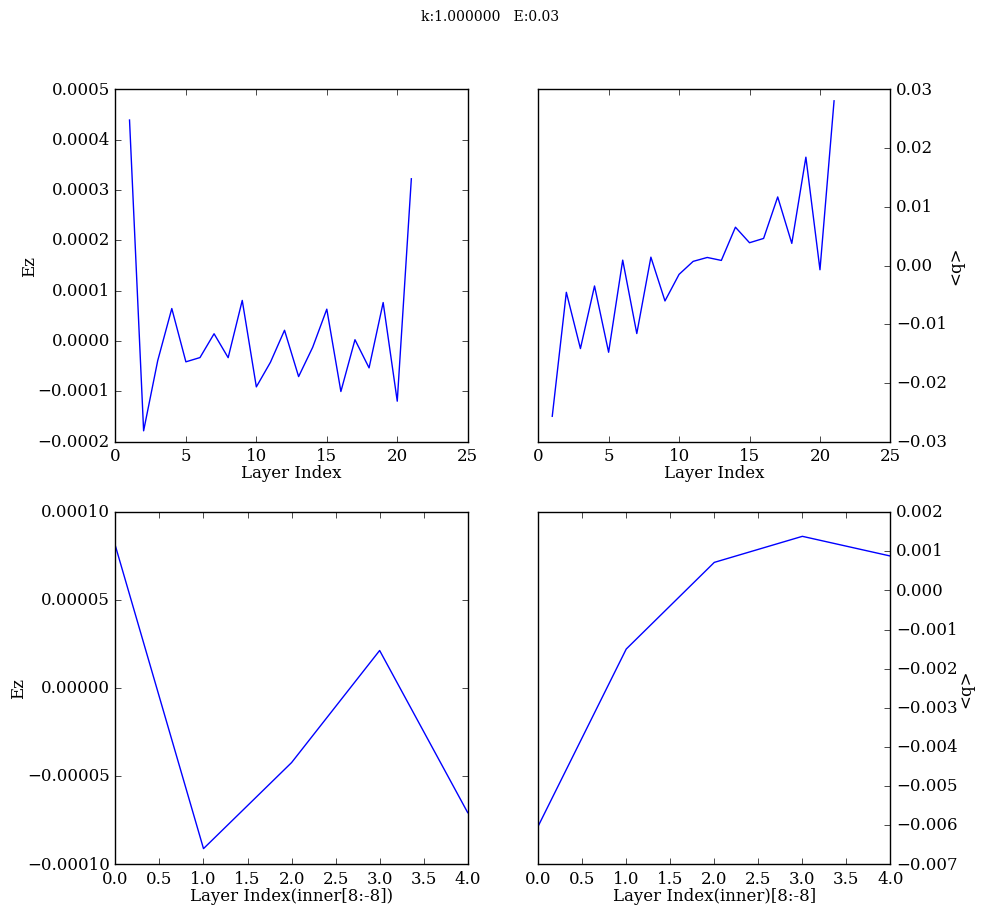

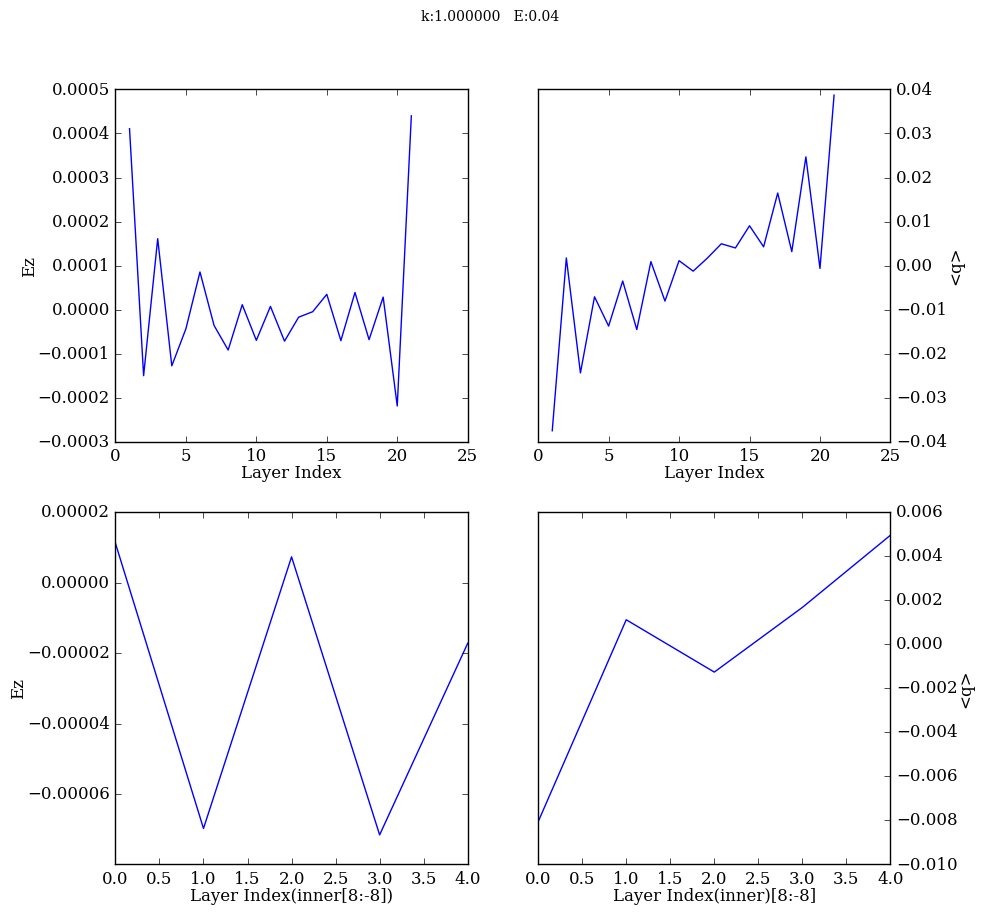

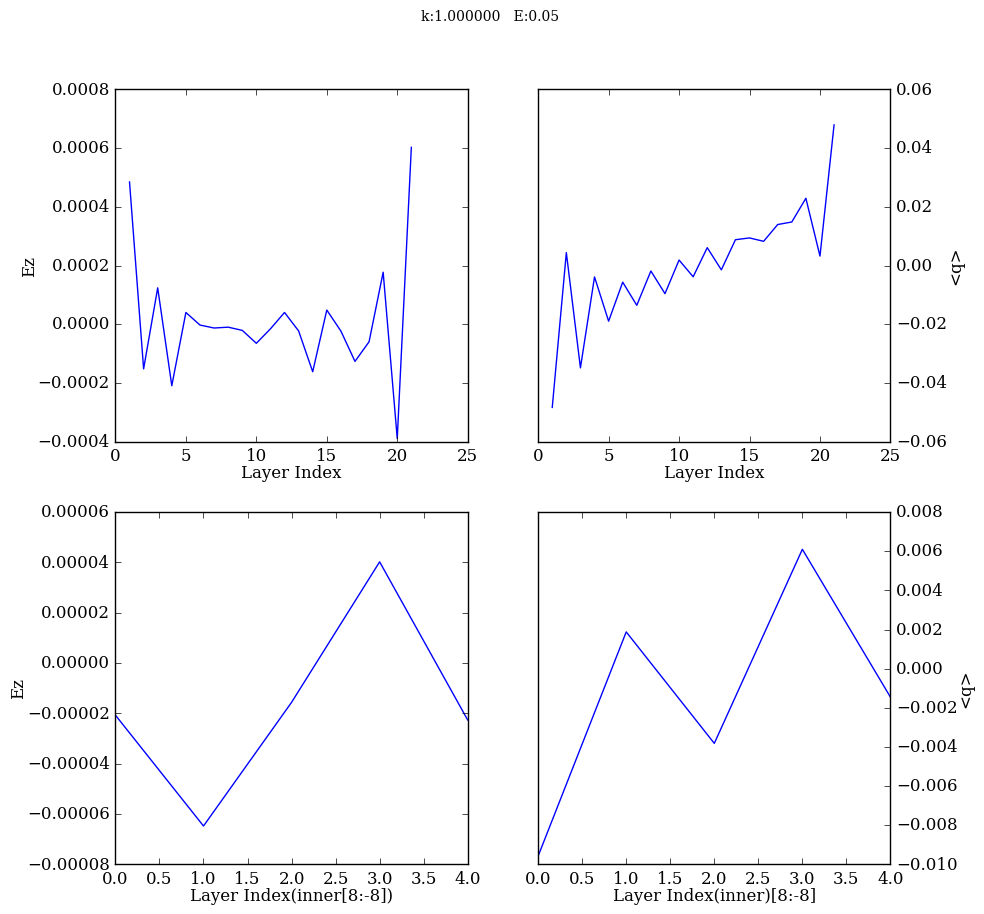

...

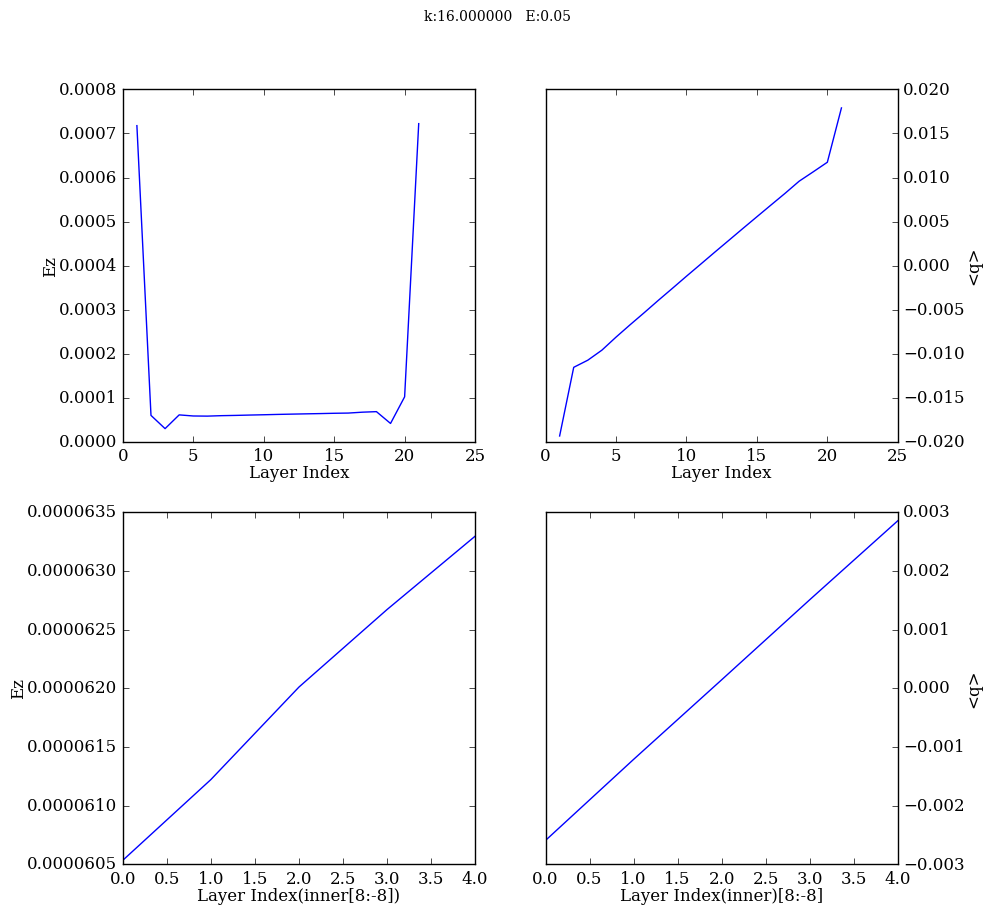

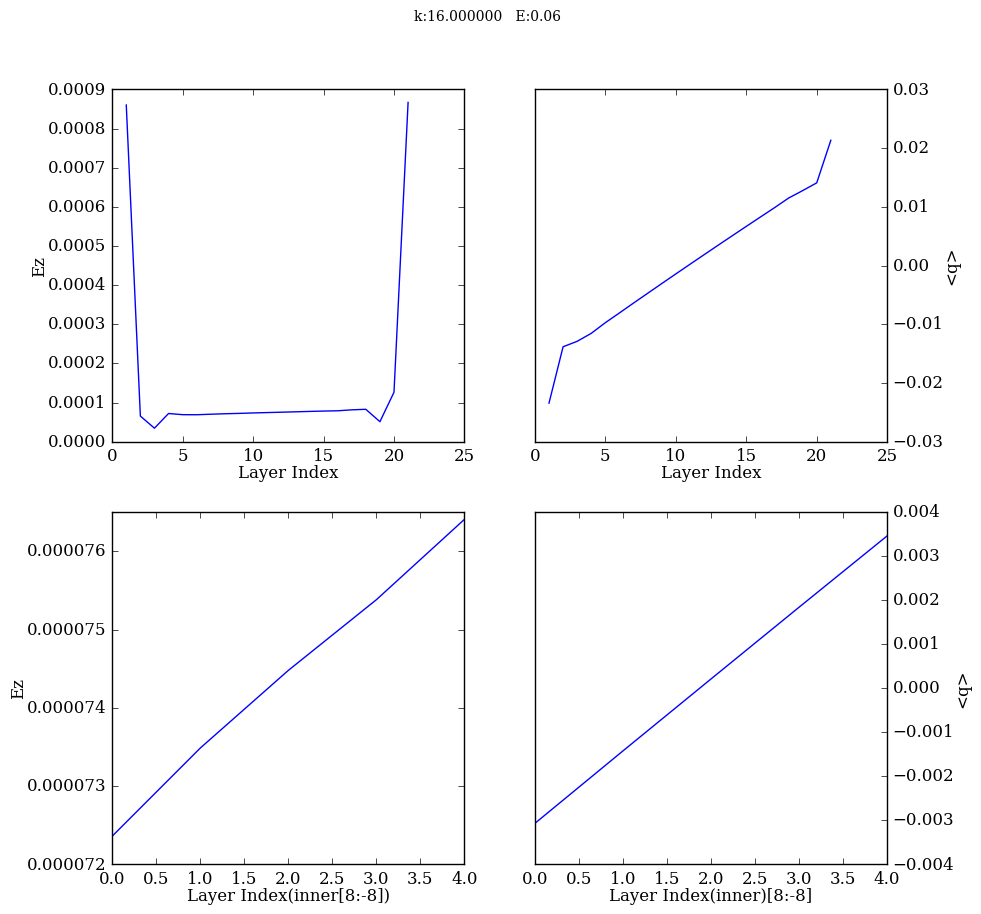

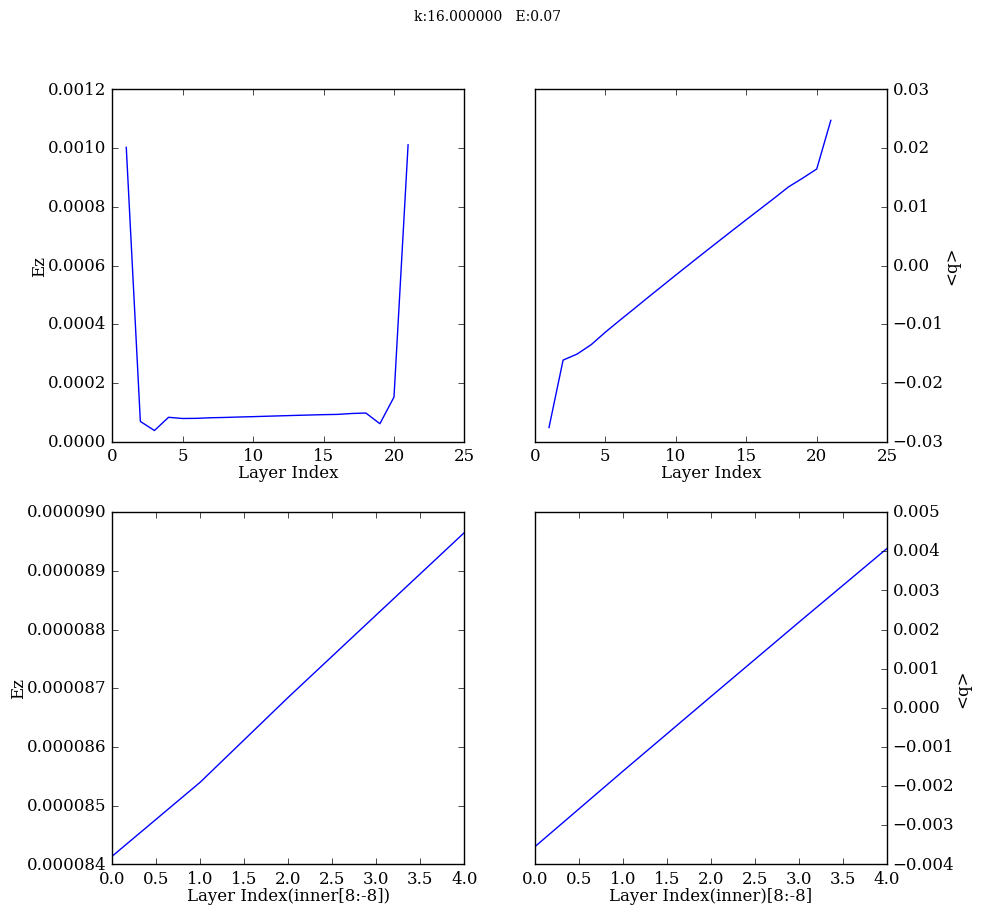

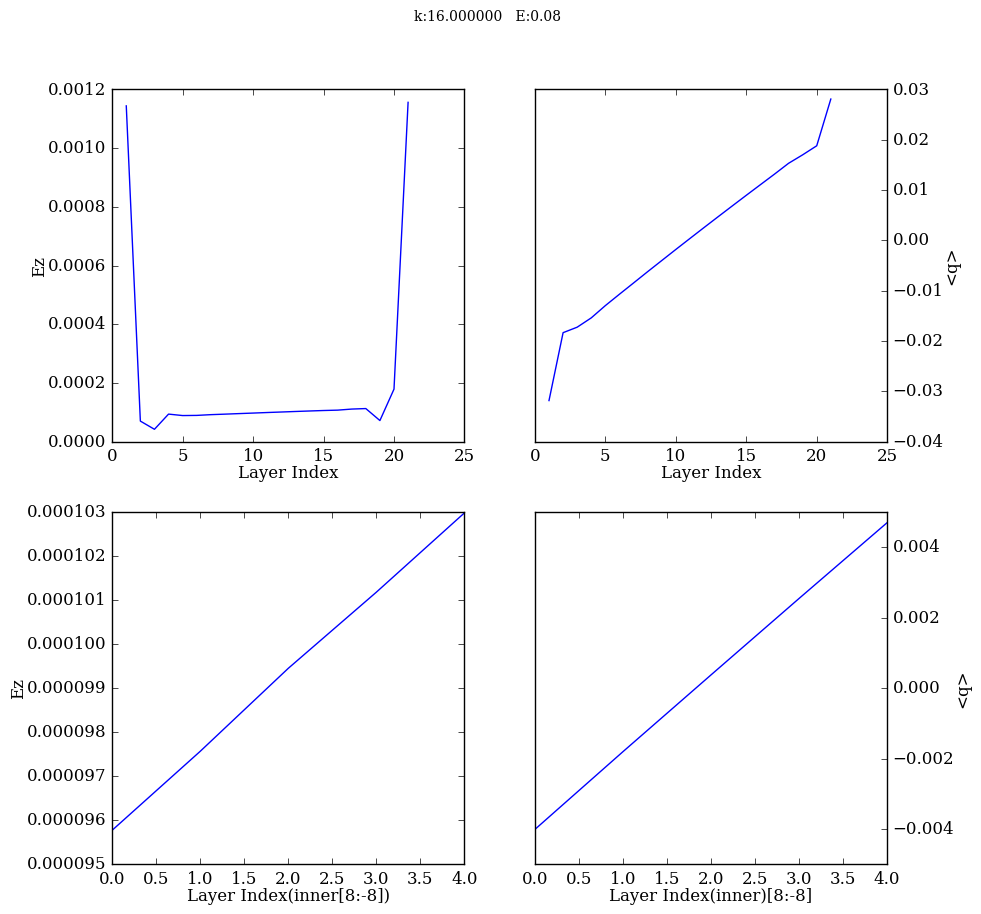

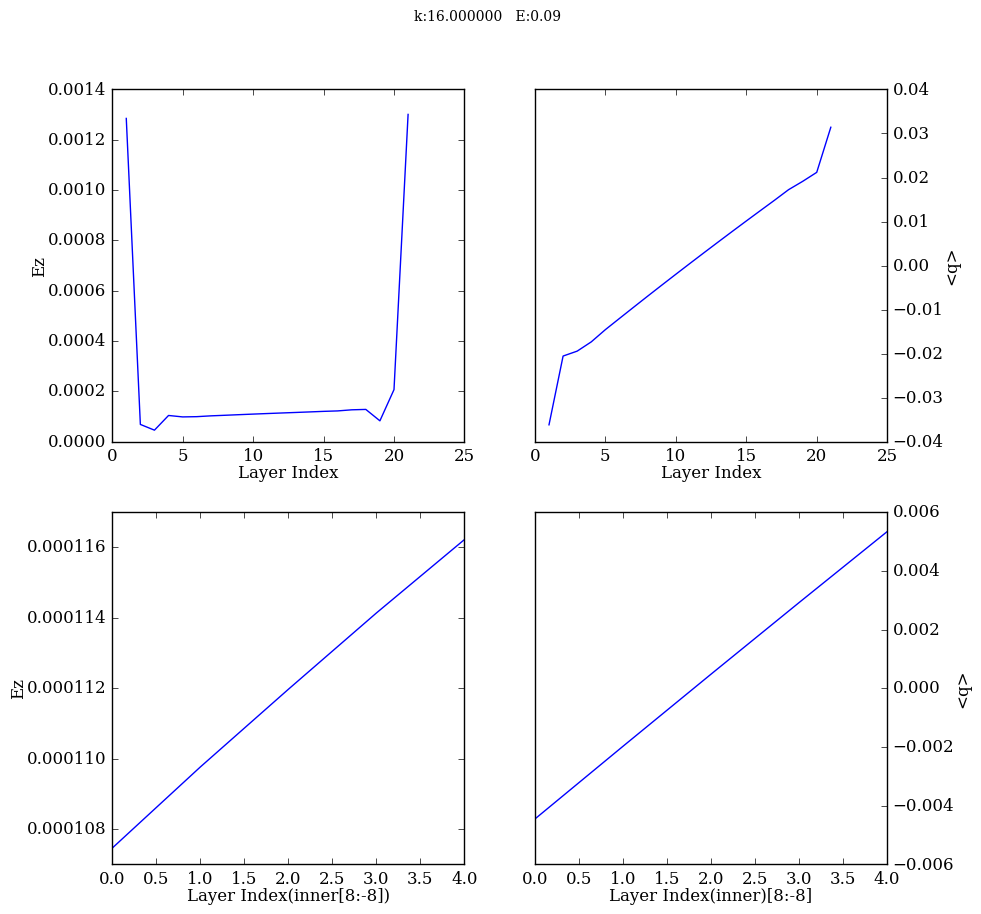

In [245]:
efield=['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09']
curvatures=[1,3,5,7,8,9,11,15,16]
thickness=[21]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]
innerLayer=8
OutResultDen=[] #list of list i.e [[k,e,dipole],[...],[....]]
OutResultDPole=[]
A=28.805999*16.631151
for info in KET:
    file="PtSlab111Z"+str(info[2])+'O_6'+"K_"+str(info[0])+"E_"+info[1]+".dump"
    try:
        print("Reading: "+"../KTuningPolynomialSelf/Simulation/"+file)
        rawData=feam.DumpExtractor("../KTuningPolynomialSelf/Simulation/"+file,frames,nMol[str(info[2])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(info[2])])
    except:
        print("Error in reading "+"../KTuningPolynomialSelf/Simulation/"+file)
        continue
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavz=num.array(eavz)/23.0609    #convert to V/ang
    const0=num.polyfit(zav[8:-8],chav[8:-8],1)
    const1=num.polyfit(range(len(chav[8:-8])),chav[8:-8],1)
    const2=num.polyfit(range(len(zav[8:-8])),zav[8:-8],1)
    numberPerLayer=2*len(layer[8][0])
    dz=abs(zav[14]-zav[13])
    
    
    
    dipoleDen=const1[0]*len(layer[8][0])/(A*2)
    dipole=const0*dz*dz/4
    
    
    print("=========K:%d=====E:%f=======T:%d======\n"%(info[0],float(info[1])*1e-1,info[2]))
    print(dipoleDen*1.6e-19,dipole[0]*1.6e-19)
    
    OutResultDen.append([info[0],float(info[1]),dipoleDen*1.6e-19])
    OutResultDPole.append([info[0],float(info[1]),dipole[0]*1.6e-19])
    
    fig=plt.figure(figsize=(10,10),)
    
    ax1=fig.add_subplot(2,2,1)
    ax1.plot(range(1,len(a)+1),eavz)
    ax1.set_xlabel("Layer Index")
    ax1.set_ylabel("Ez")
    
    ax2=fig.add_subplot(2,2,2)
    ax2.plot(range(1,len(a)+1),chav)
    ax2.set_xlabel("Layer Index")
    ax2.set_ylabel("<q>")
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position("right")
    
    
    ax3=fig.add_subplot(2,2,3)
    ax3.plot(eavz[8:-8])
    ax3.set_xlabel("Layer Index(inner[8:-8])")
    ax3.set_ylabel("Ez")
    
    ax4=fig.add_subplot(2,2,4)
    ax4.plot(chav[8:-8])
    ax4.set_xlabel("Layer Index(inner)[8:-8]")
    ax4.set_ylabel("<q>")
    ax4.yaxis.tick_right()
    ax4.yaxis.set_label_position("right")
    
    fig.suptitle('k:%f   E:%s'%(info[0],info[1]))
    plt.draw()
OutResultDen=num.array(OutResultDen)
OutResultDPole=num.array(OutResultDPole)

print("densitywritting")
num.savetxt("../KTuningPolynomialSelf/Results/KEDDensity.out",OutResultDen)
num.savetxt("../KTuningPolynomialSelf/Results/KEDPole.out",OutResultDPole)
     
     
    

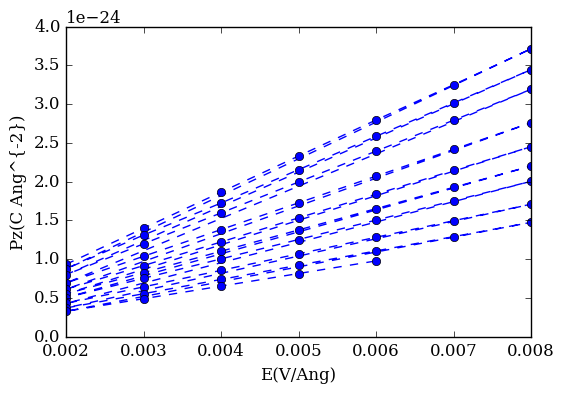

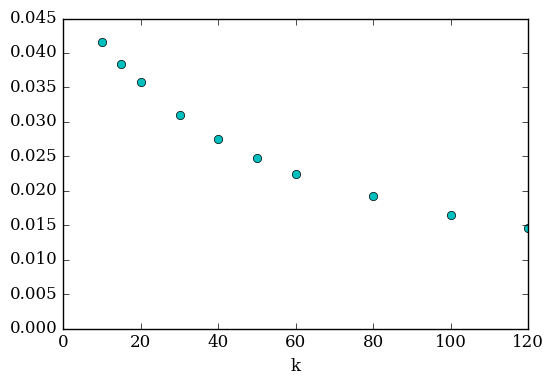

In [7]:

OutResult3=num.loadtxt('../KTuning/Results/KEDDensity.out')




o3=OutResult3[3:]
lab.plot(o3[:-2,1],o3[:-2,2],'ob--')
lab.xlabel("E(V/Ang)")
lab.ylabel("Pz(C Ang^{-2})")
lab.show()




dat3=num.array(feam.CurvatureSlope(num.array(OutResult3[3:])))



lab.plot(dat3[:,0],dat3[:,1],'o')
lab.xlabel("k")
#lab.ylabel("alpha(A^3)")
lab.show()

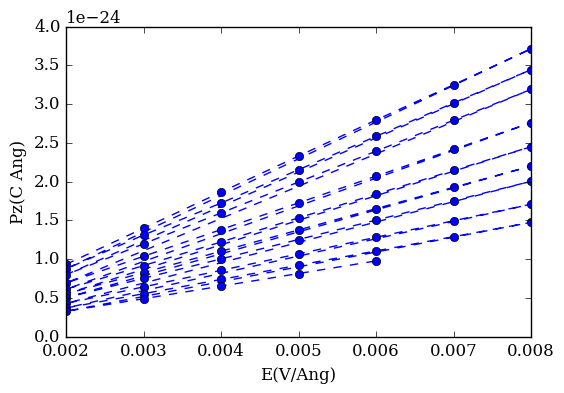

(array([  2.45698443,  48.92569691]), array([[ 0.00015814,  0.00457584],
       [ 0.00457584,  0.14032747]]))


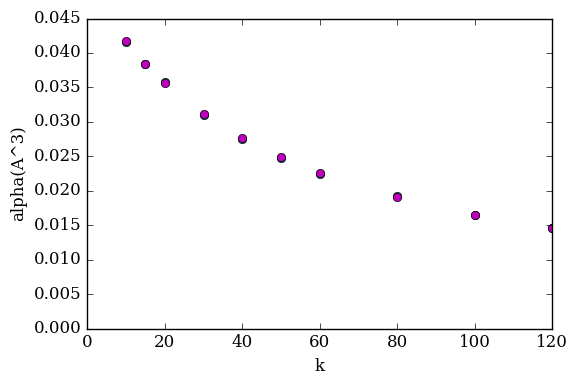

-48.522912573


In [26]:
OutResult3=num.loadtxt('../KTuning/Results/KED.out')




o3=OutResult3[3:]
lab.plot(o3[:-2,1],o3[:-2,2],'ob--')
lab.xlabel("E(V/Ang)")
lab.ylabel("Pz(C Ang)")
lab.show()




dat3=num.array(feam.CurvatureSlope(num.array(OutResult3[3:])))
fitFx=lambda x,a,c:a/(x+c)
param=curve_fit(fitFx,dat3[:,0],dat3[:,1])
print(param)




lab.plot(dat3[:,0],dat3[:,1],'o')
lab.xlabel("k")
lab.ylabel("alpha(A^3)")
lab.plot(dat3[:,0],fitFx(dat3[:,0],param[0][0],param[0][1]),'o')
lab.show()

print(param[0][0]/6.1-param[0][1])


In [45]:
efield=['0.02']
curvatures=[20]
thickness=[36]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]


for info in KET:
    file="PtSlab111Z"+str(info[2])+"K_"+str(info[0])+"E_"+info[1]+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(info[2])],0)
        
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(info[2])])
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavz=num.array(eavz)*1e-1
    chav=num.array(chav)
    zav=num.array(zav)
    const0=num.polyfit(zav[3:-3],chav[3:-3],1)
    const1=num.polyfit(range(len(chav[3:-3])),chav[3:-3],1)
    const2=num.polyfit(range(len(zav[3:-3])),zav[3:-3],1)
    print("=========K:%d=====E:%s=======T:%d======\n"%(info[0],info[1],info[2]))
    print("M_qz: %f\nM_q: %f\nM_z: %f\nM_q/M_z: %f\n\n"%(const0[0],const1[0],const2[0],const1[0]/const2[0]))
    lab.plot(zav,'o')
    lab.xlabel("Layer Index")
    lab.ylabel("Average")
    lab.show()
num.savetxt("../KTuning/Results/dataN10K20E10.out",(eavz,chav,zav))
    

Error in reading ../KTuning/Simulation/PtSlab111Z36K_20E_0.02.dump


In [65]:
data4=num.loadtxt('../KTuning/Results/dataN4K20E10.out')
data1=num.loadtxt('../KTuning/Results/dataN1K20E10.out')
data10=num.loadtxt('../KTuning/Results/dataN10K20E10.out')
data=num.loadtxt('../KTuning/Results/data.out')

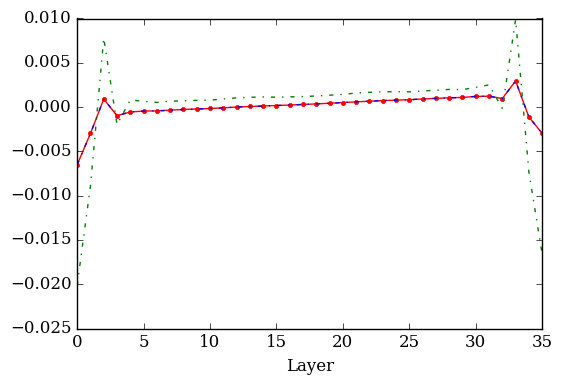

In [84]:
lab.plot(data10[1][:],'.-r')
lab.plot(data4[1][:],'-.b')
lab.plot(data1[1][:],'-.g')
#lab.plot(data[1][:],'-.k')

lab.xlabel("Layer")
#lab.xlim([-1,38])
#lab.ylim([0,0.05])

=========K:20=====E:0.02=======N:4======

M_qz: 0.000029
M_q: 0.000066
M_z: 2.263639
M_q/M_z: 0.000029




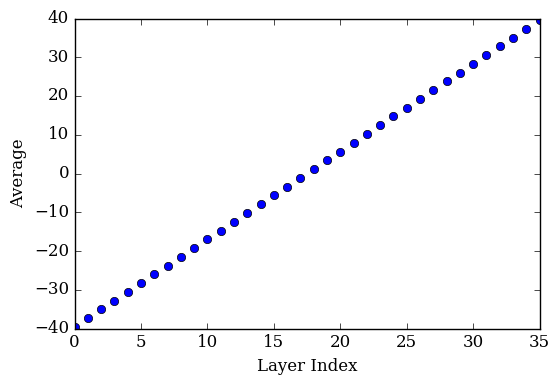

=========K:20=====E:0.04=======N:4======

M_qz: 0.000059
M_q: 0.000133
M_z: 2.263642
M_q/M_z: 0.000059




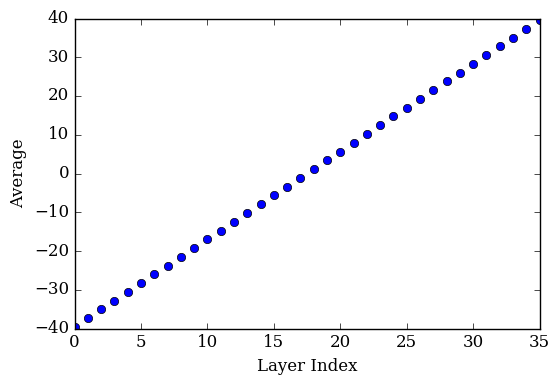

In [233]:

#changing efield ,k and N
efield=['0.02','0.04']
curvatures=[20]
thickness=[36]
N=[4]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KEN=[[k,e,n] for k in curvatures for e in efield for n in N]


for info in KEN:
    file="PtSlab111Z"+str(thickness[0])+'N_'+str(info[2])+"K_"+str(info[0])+"E_"+info[1]+".dump"
    try:
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(thickness[0])],0)
        
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(thickness[0])])
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue
    
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavz=num.array(eavz)*1e-1
    chav=num.array(chav)
    zav=num.array(zav)
    const0=num.polyfit(zav[3:-3],chav[3:-3],1)
    const1=num.polyfit(range(len(chav[3:-3])),chav[3:-3],1)
    const2=num.polyfit(range(len(zav[3:-3])),zav[3:-3],1)
    print("=========K:%d=====E:%s=======N:%d======\n"%(info[0],info[1],info[2]))
    print("M_qz: %f\nM_q: %f\nM_z: %f\nM_q/M_z: %f\n\n"%(const0[0],const1[0],const2[0],const1[0]/const2[0]))
    lab.plot(zav,'o')
    lab.xlabel("Layer Index")
    lab.ylabel("Average")
    lab.show()
    fileDataOut='../KTuning/Results/dataN'+str(info[2])+'K'+str(info[0])+'E'+info[1]+'.out'
    num.savetxt(fileDataOut,(eavz,chav,zav))

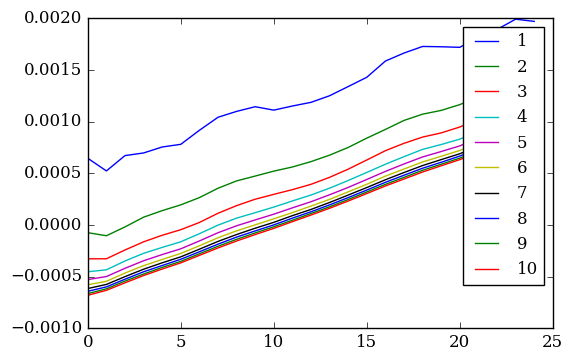

In [16]:
# compare the data for diff N and diff E
efield=['0.02']
curvatures=[20]
thickness=[36]
N=[1,2,3,4,5,6,7,8,9,10]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KEN=[[k,e,n] for k in curvatures for e in efield for n in N]
#colors=feam.generate_color(36)
for info in KEN:
    fileDataOut='../KTuning/Results/dataN'+str(info[2])+'K'+str(info[0])+'E'+info[1]+'.out'
    data=num.loadtxt(fileDataOut)
    lab.plot(data[1][5:30],label=str(info[2]))
    lab.legend()



In [14]:
2.901848048e-33/2.7000000000000003e-35

107.47585362962961

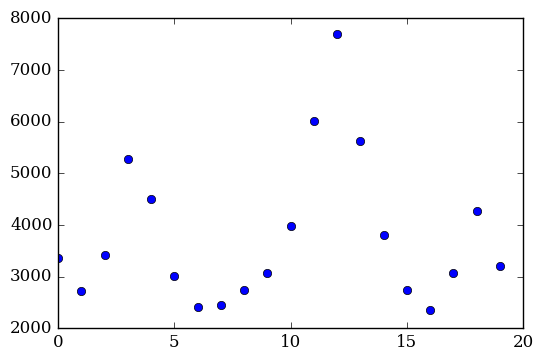

In [56]:
lab.plot(2/eavz[8:-8],'o')



In [8]:
rawData=feam.DumpExtractor("../KTuning/Simulation/PtSlab111Z36SmallTKConstN_2K_3E_0.dump",100,2592,0)
[vx,vy,vz]=rawData["velocity"]
[x,y,z]=rawData["position"]
[c,w]=rawData["chargeQV"]
[ex,ey,ez]=rawData["electricField"]
[layer,a]=feam.Layers(z,2592)

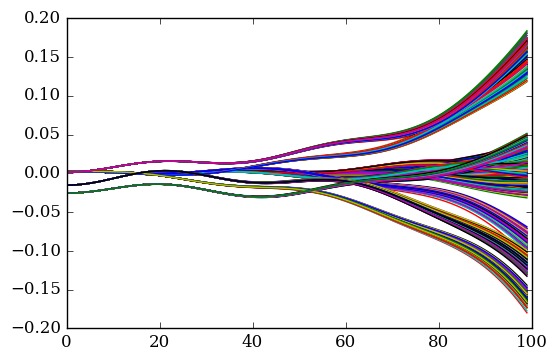

In [10]:
lab.plot(c)
lab.show()


### Analysis for polarizablity of different layered system with constant K and constant field

In [94]:
efield=['0.01']
curvatures=[24]
thickness=[9,12,15,18,21,24,27,30,33,36,39]
N=[1,2,3,4,5,6,7,8,9,10]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
Lx=28.805999
Ly=16.631151
Lz={'9':18.18,'12':24.95,'15':31.73,'18':38.51,'21':45.92,'24':52.08,'27':58.87,'30':65.65,'33':72.44,'36':79.23,'39':86.02}
frames=100
KEN=[[k,e,t] for k in curvatures for e in efield for t in thickness]
pz=[]
T=[]
for info in KEN:
    file="PtSlab111Z"+str(info[2])+"K_"+str(info[0])+"E_"+info[1]+".report"
    try:
        outData=feam.ReportExtractor("../KTuning/Simulation/"+file,13)
        pz.append(1e10*outData[0]/(Lz[str(info[2])]*Lx*Ly))
        T.append(info[2])
        rawData=feam.DumpExtractor("../KTuning/Simulation/"+file,frames,nMol[str(thickness[0])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(thickness[0])])
        
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue

In [95]:
feam.ReportExtractor('../KTuning/Simulation/PtSlab111Z36.report',11)

[0.0, 0.0]

(array([  4.37919931e-26,  -4.61546726e-24]), array([[  7.57212685e-55,  -5.04303646e-52],
       [ -5.04303646e-52,   4.97665909e-49]]))


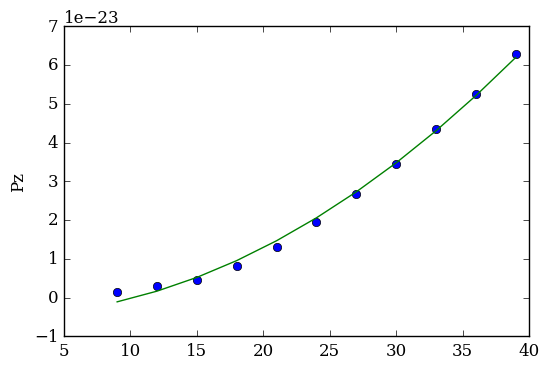

In [96]:

fitFx=lambda x,a,c:a*x**2+c
param=curve_fit(fitFx,T,pz)
print(param)
lab.plot(T,pz,'o')
lab.plot(T,fitFx(num.array(thickness),param[0][0],param[0][1]))
lab.ylabel("Pz")

In [97]:
param[0][1]

-4.6154672612116577e-24

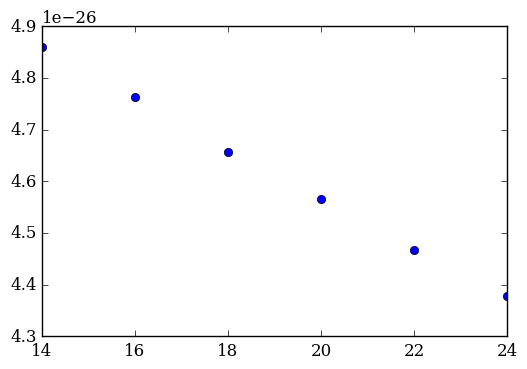

In [99]:
cur=[4.86076688e-26,4.76413611e-26,4.65702755e-26,4.56554559e-26,4.46821079e-26,4.37919931e-26]
base=[-5.33310080e-24,-5.12569907e-24,-5.05080107e-24,-4.81750933e-24,-4.68516815e-24,-4.61546726e-24]
k=[14,16,18,20,22,24]
lab.plot(k,cur,'o')

In [101]:
file="Slab111Z9"+"DSF.dump"
frames=100
rawData=feam.DumpExtractor("../KTuning/src/"+file,100,1080,0)
[vxd,vyd,vzd]=rawData["velocity"]
[xd,yd,zd]=rawData["position"]
[cd,wd]=rawData["chargeQV"]
[exd,eyd,ezd]=rawData["electricField"]
[layerd,ad]=feam.Layers(zd,1080)
begin=0

eavzd=[]
eavxd=[]
eavyd=[]
chavd=[]
zavd=[]
    
for counter in range(len(ad)):
    eavzd.append(num.sum(num.sum(ezd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    chavd.append(num.sum(num.sum(cd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavxd.append(num.sum(num.sum(exd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavyd.append(num.sum(num.sum(eyd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    zavd.append(num.sum(num.sum(zd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))        


In [66]:
file="Slab111Z9"+"Ewald.dump"
frames=100
rawData=feam.DumpExtractor("../KTuning/src/Slab111Z9Ewald.dump",100,1080,0)
[vxe,vye,vze]=rawData["velocity"]
[xe,ye,ze]=rawData["position"]
[ce,we]=rawData["chargeQV"]
[exe,eye,eze]=rawData["electricField"]
[layere,ae]=feam.Layers(ze,1080)
begin=0

eavze=[]
eavxe=[]
eavye=[]
chave=[]
zave=[]
for counter in range(len(ae)):
    eavze.append(num.sum(num.sum(eze[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    chave.append(num.sum(num.sum(ce[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    eavxe.append(num.sum(num.sum(exe[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    eavye.append(num.sum(num.sum(eye[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    zave.append(num.sum(num.sum(ze[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))        

    


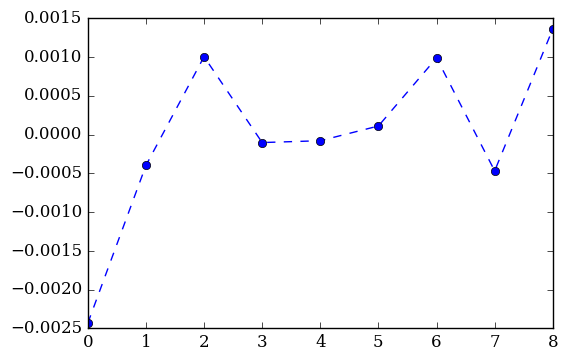

In [73]:
lab.plot(num.array(chave[:]),'o--')
lab.show()


In [51]:
ae.size

9

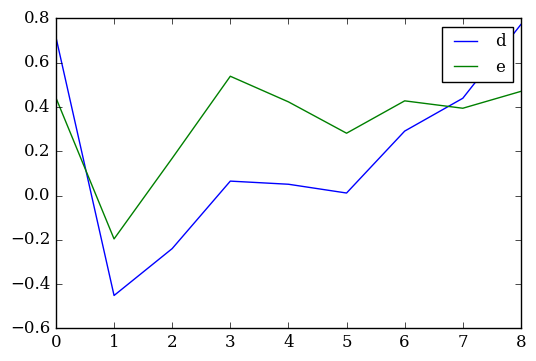

In [23]:
lab.plot(eavzd,label="d")
lab.plot(eavze,label="e")
lab.legend()
lab.show()

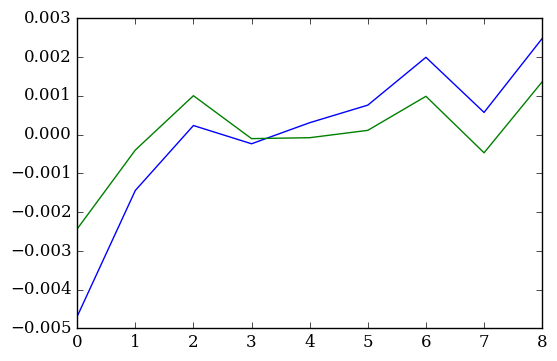

In [24]:
lab.plot(chavd)
lab.plot(chave)
lab.show()

In [25]:
rawData=feam.DumpExtractor("../KTuning/Simulation/PtSlab111Z9K_20E_0.01.dump",100,648,0)
[vx,vy,vz]=rawData["velocity"]
[x,y,z]=rawData["position"]
[c,w]=rawData["chargeQV"]
[ex,ey,ez]=rawData["electricField"]
[layer,a]=feam.Layers(z,648)
begin=0

eavz=[]
eavx=[]
eavy=[]
chav=[]
zav=[]
for counter in range(len(a)):
    eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))        

    

In [103]:
frames=100
rawData=feam.DumpExtractor("../KTuning/src/Slab111Z9DSFSurfaceTerm.dump",100,1080,0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,1080)
begin=0

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        
 

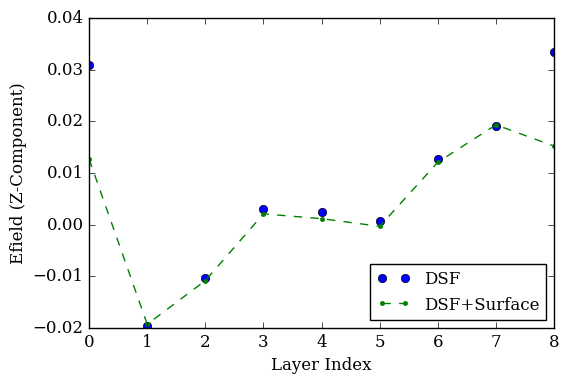

In [106]:
lab.plot(eavzd,'o',label="DSF")
#lab.plot(eavze,'--',label="Ewald")
lab.plot(eavzs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Efield (Z-Component)")
lab.legend(loc=4)
lab.savefig("../KTuning/Efield.pdf")
lab.show()

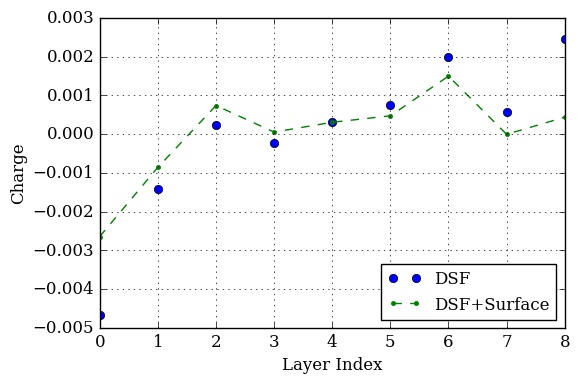

In [107]:
lab.plot(chavd,'o',label="DSF")
#lab.plot(chave,'--',label="Ewald")
lab.plot(chavs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Charge")
lab.legend(loc=4)
lab.grid()
lab.savefig("../KTuning/charge.pdf")
lab.show()

# Comparison of the DSF and DSF+SurfaceTerm

## 9 layer System

In [121]:
file="Slab111Z9"+"DSF.dump"
frames=100
rawData=feam.DumpExtractor("../KTuning/src/"+file,100,1080,0)
[vxd,vyd,vzd]=rawData["velocity"]
[xd,yd,zd]=rawData["position"]
[cd,wd]=rawData["chargeQV"]
[exd,eyd,ezd]=rawData["electricField"]
[layerd,ad]=feam.Layers(zd,1080)
begin=0

eavzd=[]
eavxd=[]
eavyd=[]
chavd=[]
zavd=[]
    
for counter in range(len(ad)):
    eavzd.append(num.sum(num.sum(ezd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    chavd.append(num.sum(num.sum(cd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavxd.append(num.sum(num.sum(exd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavyd.append(num.sum(num.sum(eyd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    zavd.append(num.sum(num.sum(zd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))        


frames=100
rawData=feam.DumpExtractor("../KTuning/src/Slab111Z9DSFSurfaceTerm.dump",100,1080,0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,1080)
begin=0

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        

    
file="Slab111Z9"+"Ewald.dump"
frames=100
rawData=feam.DumpExtractor("../KTuning/src/Slab111Z9Ewald.dump",100,1080,0)
[vxe,vye,vze]=rawData["velocity"]
[xe,ye,ze]=rawData["position"]
[ce,we]=rawData["chargeQV"]
[exe,eye,eze]=rawData["electricField"]
[layere,ae]=feam.Layers(ze,1080)
begin=0

eavze=[]
eavxe=[]
eavye=[]
chave=[]
zave=[]
for counter in range(len(ae)):
    eavze.append(num.sum(num.sum(eze[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    chave.append(num.sum(num.sum(ce[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    eavxe.append(num.sum(num.sum(exe[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    eavye.append(num.sum(num.sum(eye[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))
    zave.append(num.sum(num.sum(ze[begin:,layere[counter][0]],axis=1)/len(layere[counter][0]))/(frames-begin))        

    

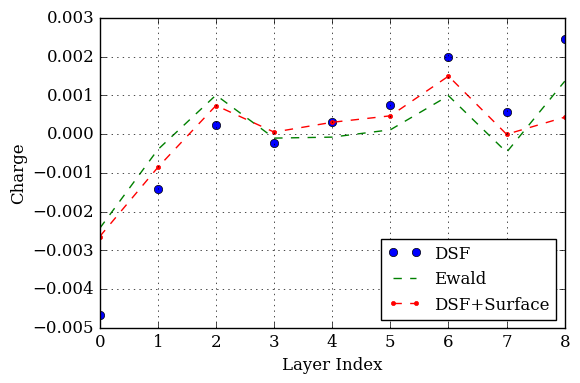

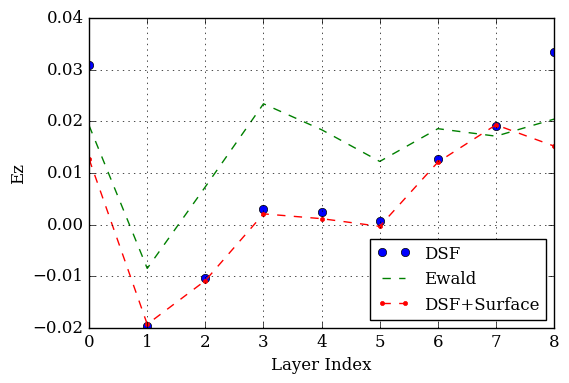

In [124]:
lab.plot(chavd,'o',label="DSF")
lab.plot(chave,'--',label="Ewald")
lab.plot(chavs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Charge")
lab.legend(loc=4)
lab.grid()
#lab.savefig("../KTuning/charge.pdf")
lab.show()

lab.plot(eavzd,'o',label="DSF")
lab.plot(eavze,'--',label="Ewald")
lab.plot(eavzs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Ez")
lab.legend(loc=4)
lab.grid()
#lab.savefig("../KTuning/charge.pdf")
lab.show()

## 18 layer System

In [126]:
file="Slab111Z18"+"DSF.dump"
frames=100
rawData=feam.DumpExtractor("../KTuning/src/"+file,100,6480,0)
[vxd,vyd,vzd]=rawData["velocity"]
[xd,yd,zd]=rawData["position"]
[cd,wd]=rawData["chargeQV"]
[exd,eyd,ezd]=rawData["electricField"]
[layerd,ad]=feam.Layers(zd,6480)
begin=0

eavzd=[]
eavxd=[]
eavyd=[]
chavd=[]
zavd=[]
    
for counter in range(len(ad)):
    eavzd.append(num.sum(num.sum(ezd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    chavd.append(num.sum(num.sum(cd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavxd.append(num.sum(num.sum(exd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    eavyd.append(num.sum(num.sum(eyd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))
    zavd.append(num.sum(num.sum(zd[begin:,layerd[counter][0]],axis=1)/len(layerd[counter][0]))/(frames-begin))        


frames=100
rawData=feam.DumpExtractor("../KTuning/src/Slab111Z18DSFSurface.dump",100,6480,0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,6480)
begin=0

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        
 

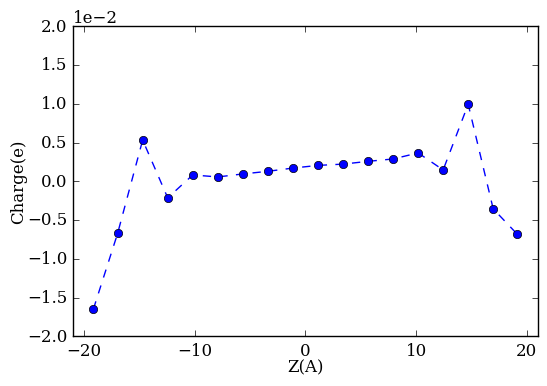

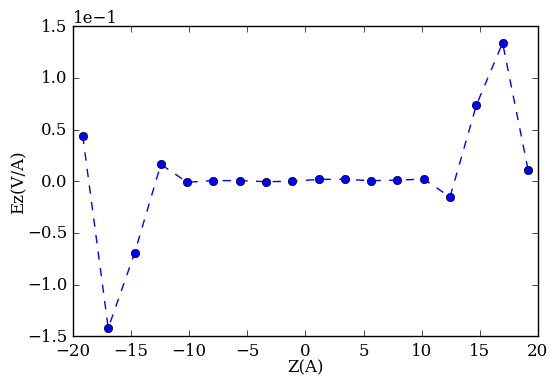

In [84]:
#lab.plot(chavd,'o',label="DSF")
#lab.plot(chave,'--',label="Ewald")
lab.plot(zavs,chavs,'o--',label='DSF+Surface')
lab.xlabel("Z(A)")
lab.ylabel("Charge(e)")
lab.ticklabel_format(axis='y',style='sci',scilimits=(1,4))
#lab.legend(loc=9)
lab.ylim([-0.020,0.020])
lab.xlim([-21,21])
lab.savefig("../KTuning/charge.eps")
lab.show()

#lab.plot(eavzd,'o',label="DSF")
#lab.plot(chave,'--',label="Ewald")
lab.plot(zavs,eavzs,'o--',label='DSF+Surface')
lab.xlabel("Z(A)")
lab.ylabel("Ez(V/A)")
lab.ticklabel_format(axis='y',style='sci',scilimits=(1,4))
#lab.legend(loc=9)
#lab.grid()
lab.savefig("../KTuning/efield.eps")
lab.show()

## Analysis for 21 Layer

In [134]:
frames=100
rawData=feam.DumpExtractor("../KTuning/WithSurfaceTerm/Slab111Z21.dump",100,10080,0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,10080)
begin=50

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        
 

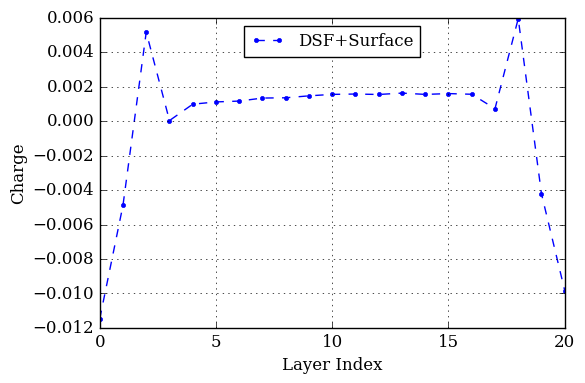

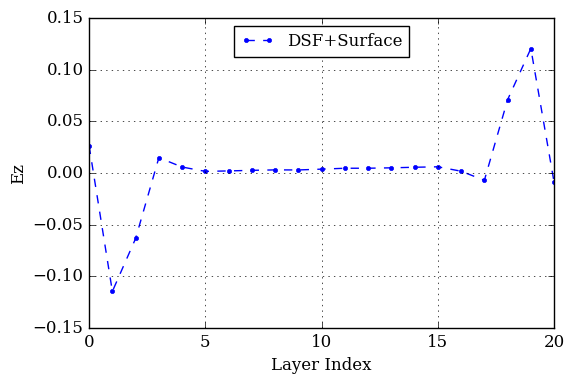

In [135]:

lab.plot(chavs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Charge")
lab.legend(loc=9)
lab.grid()
#lab.savefig("../KTuning/charge.pdf")
lab.show()

lab.plot(eavzs,'.--',label='DSF+Surface')
lab.xlabel("Layer Index")
lab.ylabel("Ez")
lab.legend(loc=9)
lab.grid()
#lab.savefig("../KTuning/charge.pdf")
lab.show()

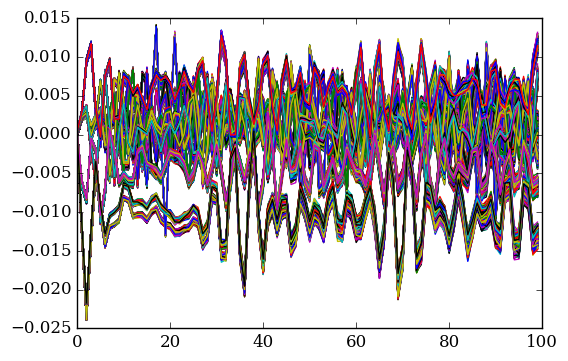

In [136]:
lab.plot(cs)
lab.show()

# Total Dipole Density of different systems

In [53]:
efield=['0.04']
curvatures=[9,12,15,20]
thickness=[9,15,18,24,30]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
Lx=28.805999
Ly=16.631151
Lz={'9':18.18,'12':24.95,'15':31.73,'18':38.51,'21':45.92,'24':52.08,'27':58.87,'30':65.65,'33':72.44,'36':79.23,'39':86.02}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]
pz=[]
T=[]
K=[]
for info in KET:
    file="PtSlab111Z"+str(info[2])+"SurfK_"+str(info[0])+"E_"+info[1]+".report"
    try:
        outData=feam.ReportExtractor("../KTuning/Simulation/"+file,13)
        #pz.append(1e10*outData[0]/(Lz[str(info[2])]*Lx*Ly))
        pz.append(outData[0])
        T.append(info[2])
        K.append(info[0])
        
    except:
        print("Error in reading "+"../KTuning/Simulation/"+file)
        continue

In [54]:
pz=num.array(pz)
T=num.array(T)
K=num.array(K)

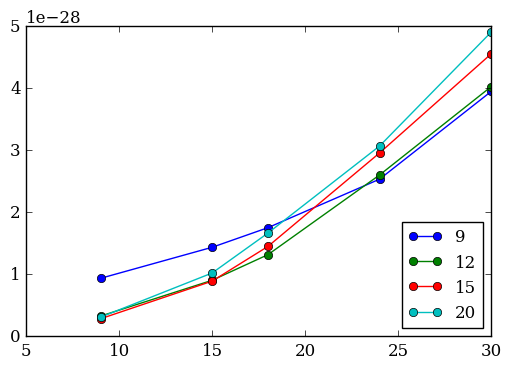

In [55]:
for var in curvatures:
    lab.plot(T[K==var],pz[K==var],'o-',label=str(var))
lab.legend(loc='lower right')
lab.show()

In [93]:
frames=100
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
rawData=feam.DumpExtractor("../KTuning/Simulation/PtTest.dump",100,nMol['21'],0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,nMol['21'])
begin=50

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        
 

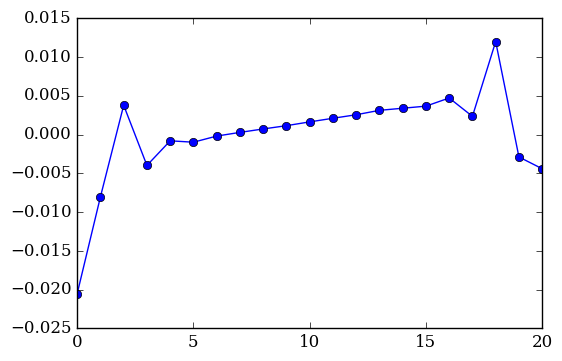

In [94]:
lab.plot(chavs,'o-')

In [237]:
frames=100
nMol={'9':648,'12':864,'15':1440,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
rawData=feam.DumpExtractor("../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_9E_0.01.dump",100,nMol['21'],0)
[vxs,vys,vzs]=rawData["velocity"]
[xs,ys,zs]=rawData["position"]
[cs,ws]=rawData["chargeQV"]
[exs,eys,ezs]=rawData["electricField"]
[layerss,ass]=feam.Layers(zs,nMol['21'])
begin=0

eavzs=[]
eavxs=[]
eavys=[]
chavs=[]
zavs=[]
for counter in range(len(ass)):
    eavzs.append(num.sum(num.sum(ezs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    chavs.append(num.sum(num.sum(cs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavxs.append(num.sum(num.sum(exs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    eavys.append(num.sum(num.sum(eys[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))
    zavs.append(num.sum(num.sum(zs[begin:,layerss[counter][0]],axis=1)/len(layerss[counter][0]))/(frames-begin))        
 

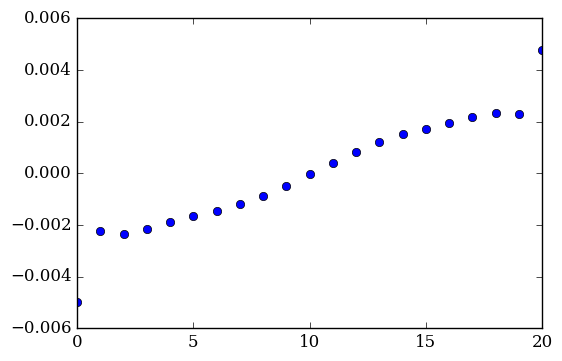

In [238]:
lab.plot(chavs,'o')
lab.show()

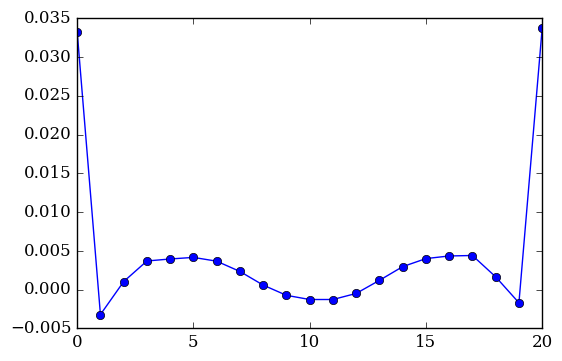

In [239]:
lab.plot(eavzs,'o-')
lab.show()

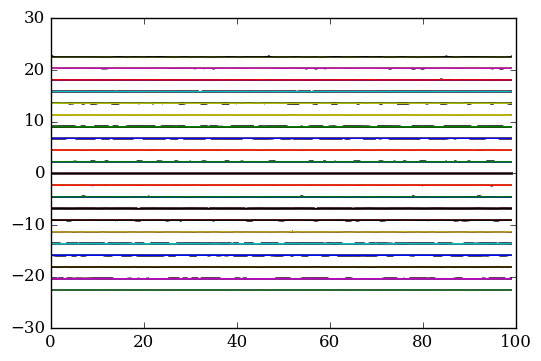

In [243]:
lab.plot(zs)
lab.show()


# Analysis for the Polynominal self Potential
# 1. Using the Total dipole of the box

In [117]:
efield=['0.02','0.04','0.06','0.08','0.1']
curvatures=[3.5,4,4.5,4.75,5.5,5.75,6,8,9,10]
thickness=[21]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}

frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]
innerLayer=8
OutResultDen=[] #list of list i.e [[k,e,dipole],[...],[....]]
OutResultDPole=[]
A=28.805999*16.631151
for info in KET:
    file="PtSlab111Z"+str(info[2])+'WithoutSO_6'+"K_"+str(info[0])+"E_"+info[1]+".report"
    #file=str(info[2])+'LCO_6'+"K_"+str(info[0])+"E_"+info[1]+".report"
    try:
        print("Reading: "+"../KTuningPolynomialSelf/Simulation/"+file)
        Data=feam.ReportExtractor("../KTuningPolynomialSelf/Simulation/"+file,13)[0]/nMol[str(info[2])]
        OutResultDPole.append([info[0],float(info[1]),Data])
    except:
        print("Error in reading "+"../KTuningPolynomialSelf/Simulation/"+file)
        continue

Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_3.5E_0.02.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_3.5E_0.04.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_3.5E_0.06.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_3.5E_0.08.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_3.5E_0.1.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4E_0.02.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4E_0.04.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4E_0.06.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4E_0.08.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4E_0.1.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21WithoutSO_6K_4.5E_0.02.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z

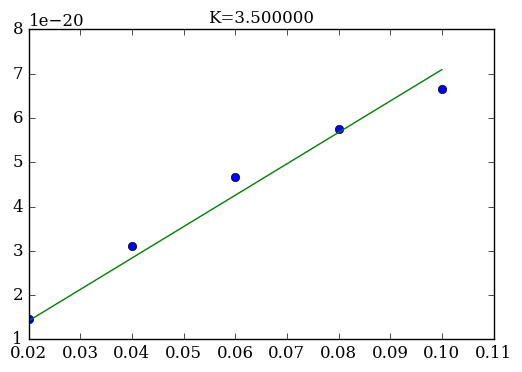

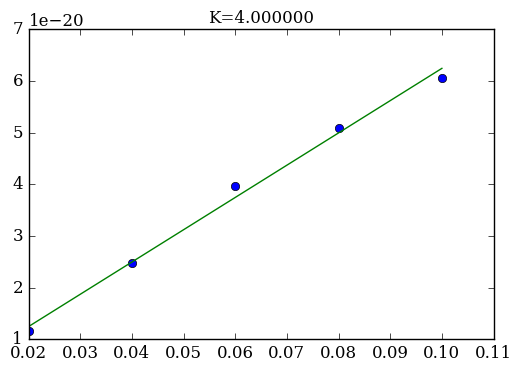

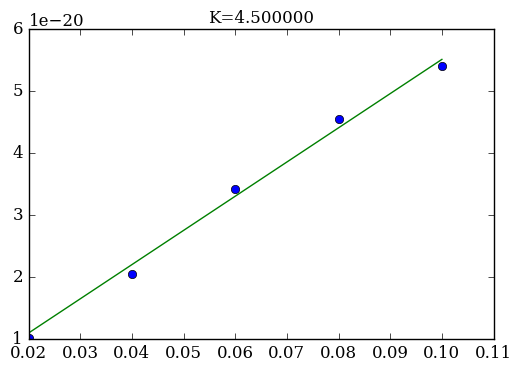

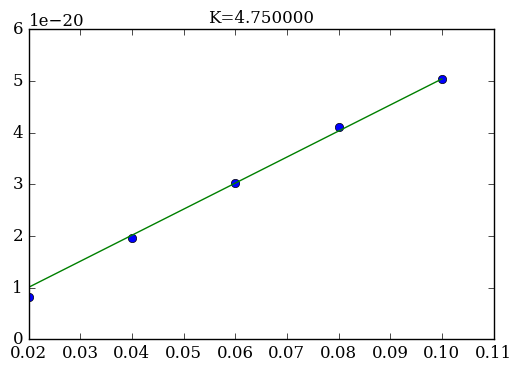

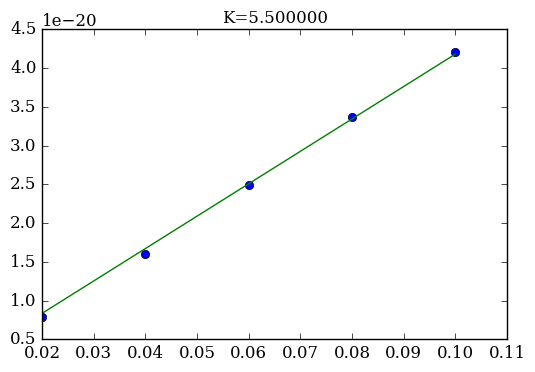

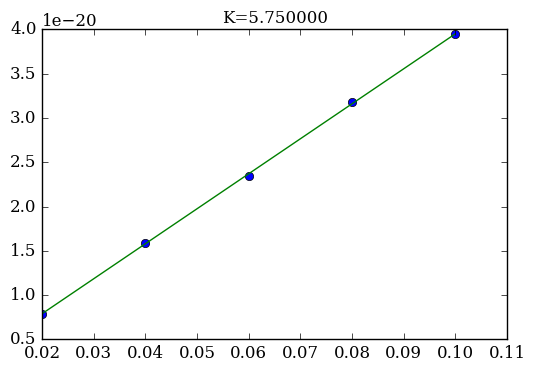

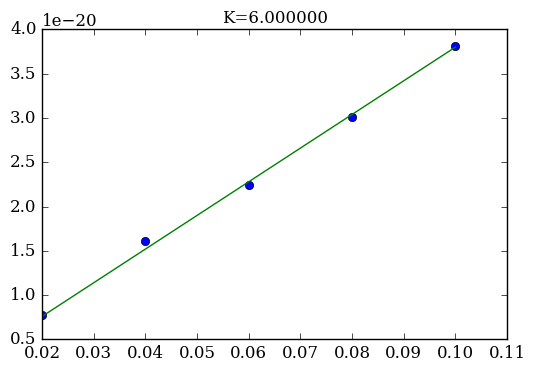

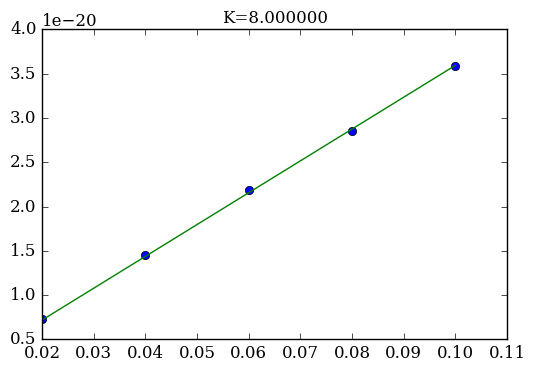

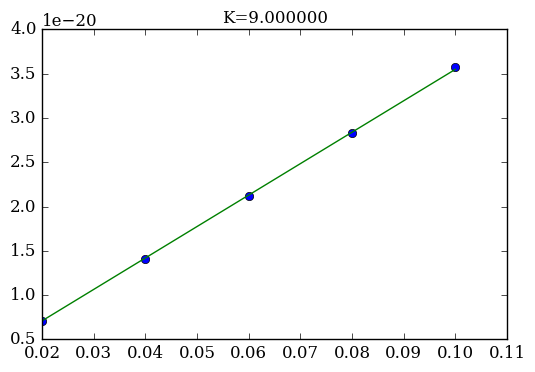

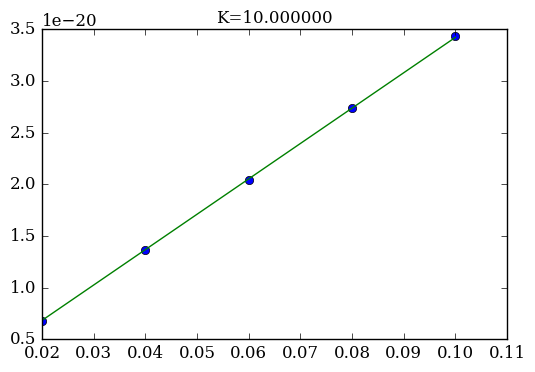

In [118]:
from scipy.optimize import curve_fit
OutResultDPole=num.array(OutResultDPole)
curvatures=[3.5,4,4.5,4.75,5.5,5.75,6,8,9,10]
slopes=[]
f=lambda x,a:a*x
for var in curvatures:
    e=OutResultDPole[OutResultDPole[:,0]==var][:,1]
    p=OutResultDPole[OutResultDPole[:,0]==var][:,2]*10**10
    param=curve_fit(f,e,p)
    a=param[0][0]
    slopes.append(a)
    lab.title("K=%f"%(var))
    lab.plot(e,p,'o')
    lab.plot(e,f(a,e))
    lab.show()
    

In [65]:
p

array([  1.28530864e-21,   2.58955247e-21,   3.88262346e-21,
         5.17926698e-21,   6.48155864e-21])

In [119]:
slopes1=num.array(slopes)/(4*num.pi*8.854e-22)


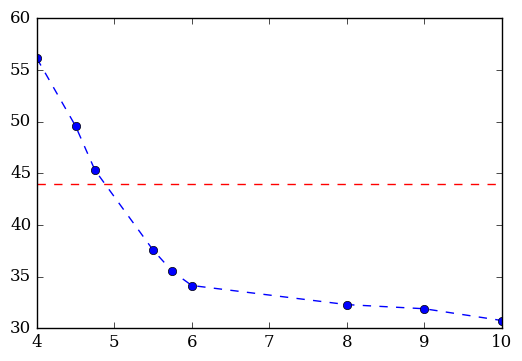

In [120]:
lab.plot(curvatures[1:],slopes1[1:],'o--')
lab.axhline(y=44,color='red',linestyle='--')

# Different Slab with same Electric field and same K
## Check if the total dipole is same for all the slabs

Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z15O_6K_5E_0.05.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z18O_6K_5E_0.05.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z21O_6K_5E_0.05.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z24O_6K_5E_0.05.report
Reading: ../KTuningPolynomialSelf/Simulation/PtSlab111Z27O_6K_5E_0.05.report


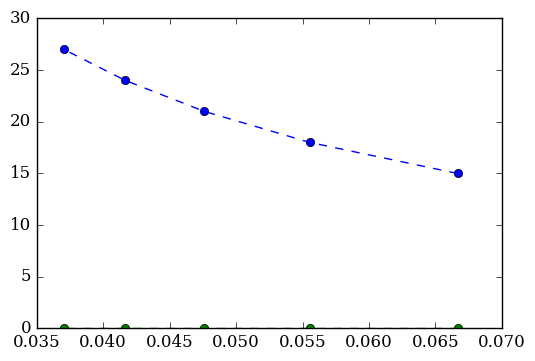

In [315]:
efield=['0.05']
curvatures=[5]
thickness=num.array([15,18,21,24,27])
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':1512,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]
innerLayer=8
OutResultDen=[] #list of list i.e [[k,e,dipole],[...],[....]]
OutResultDPole=[]
A=28.805999*16.631151
for info in KET:
    file="PtSlab111Z"+str(info[2])+'O_6'+"K_"+str(info[0])+"E_"+info[1]+".report"
    try:
        print("Reading: "+"../KTuningPolynomialSelf/Simulation/"+file)
        Data=feam.ReportExtractor("../KTuningPolynomialSelf/Simulation/"+file,13)[0]/nMol[str(info[2])]
        OutResultDPole.append([info[2],Data])
    except:
        print("Error in reading "+"../KTuningPolynomialSelf/Simulation/"+file)
        continue
#g=lambda 
lab.plot(1/thickness,OutResultDPole,'o--')

# Using Layer Dipoles

Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_3E_0.02.dump
=========K:3=====E:0.002000=======T:21======

-5.51398469396e-24 -1.55691273879e-23
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_3E_0.04.dump
=========K:3=====E:0.004000=======T:21======

1.13006362533e-23 3.1910932176e-23
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_3E_0.06.dump
=========K:3=====E:0.006000=======T:21======

1.3605624782e-23 3.84235937347e-23
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_3E_0.08.dump
=========K:3=====E:0.008000=======T:21======

1.66766178376e-23 4.70920827677e-23
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_3E_0.1.dump
=========K:3=====E:0.010000=======T:21======

2.30792920935e-23 6.5180751228e-23
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_5E_0.02.dump
=========K:5=====E:0.002000=======T:21======

3.13730700673e-24 8.86068421395e-24
Reading: ../KTuningPolynomialSelf/Simulation/21LCO_6K_5E_0.04.dump
=========K:5=====E:0.004000=======T:21===

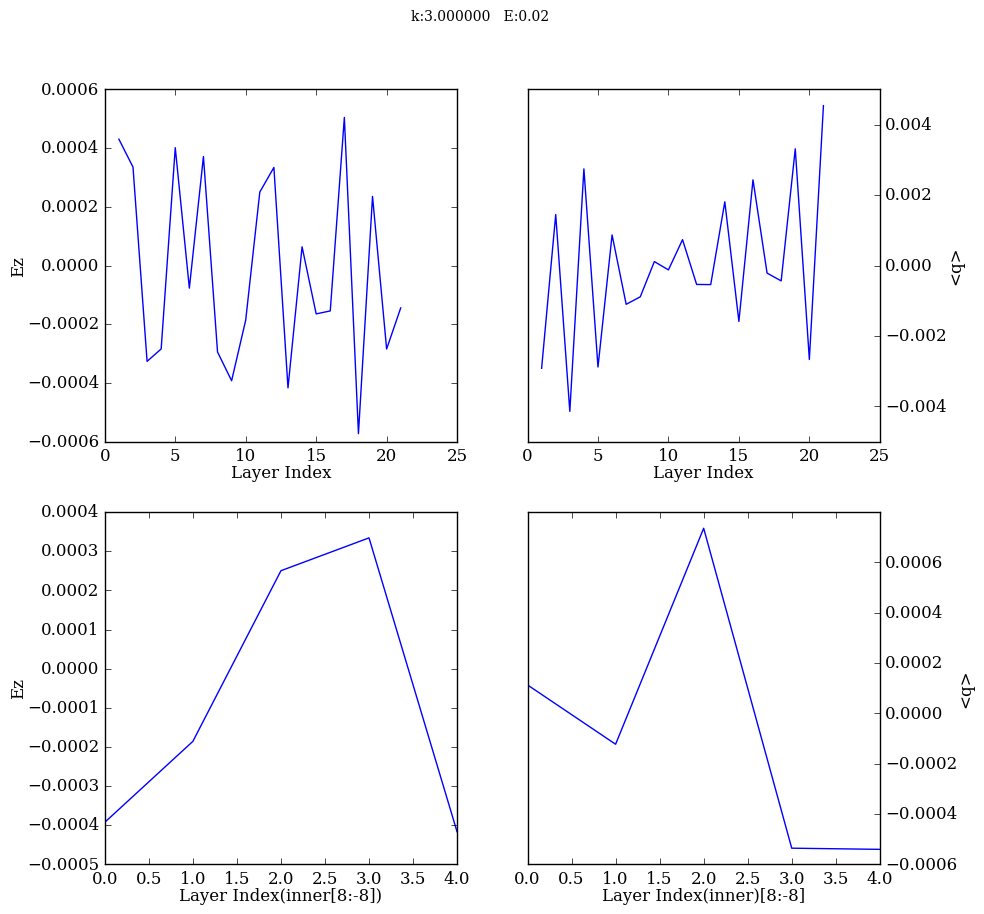

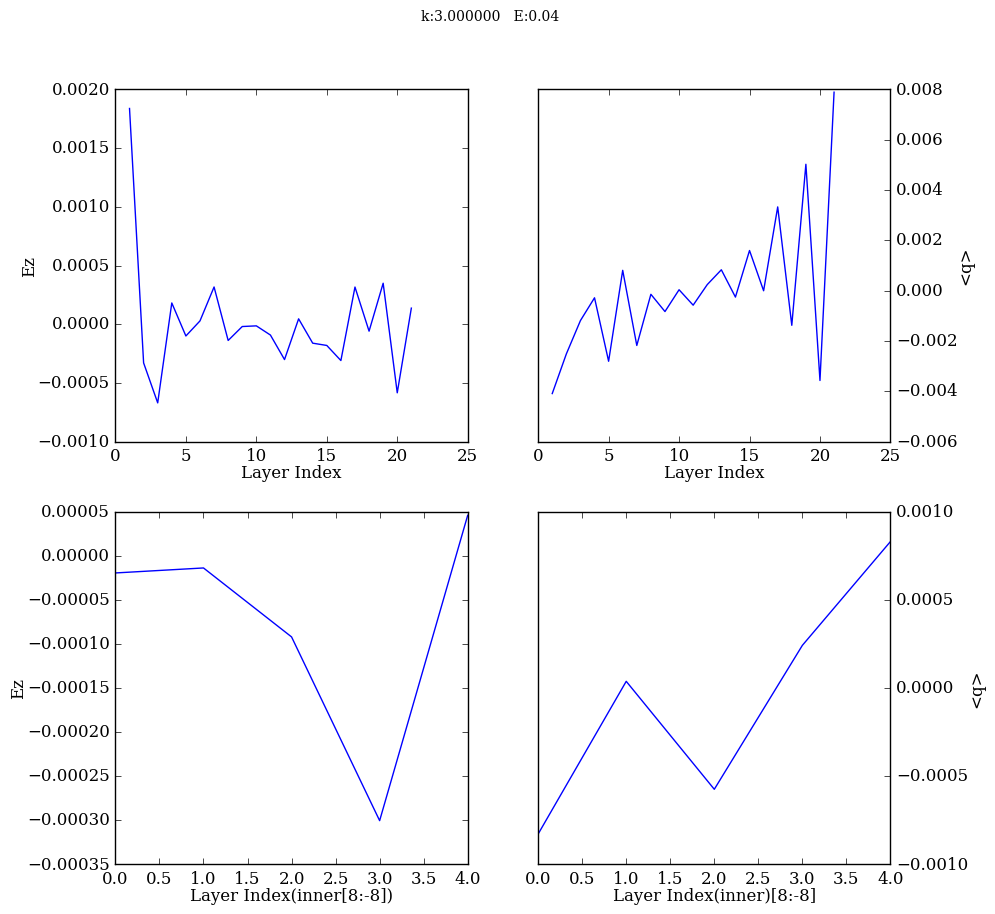

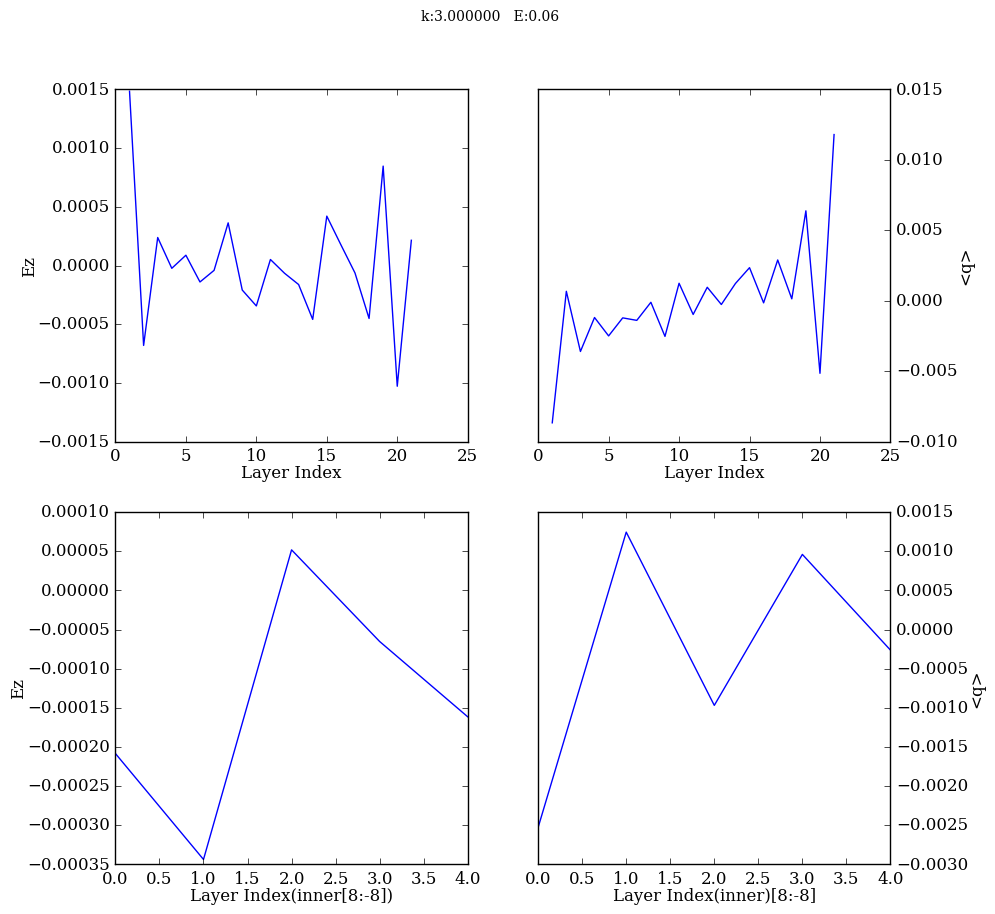

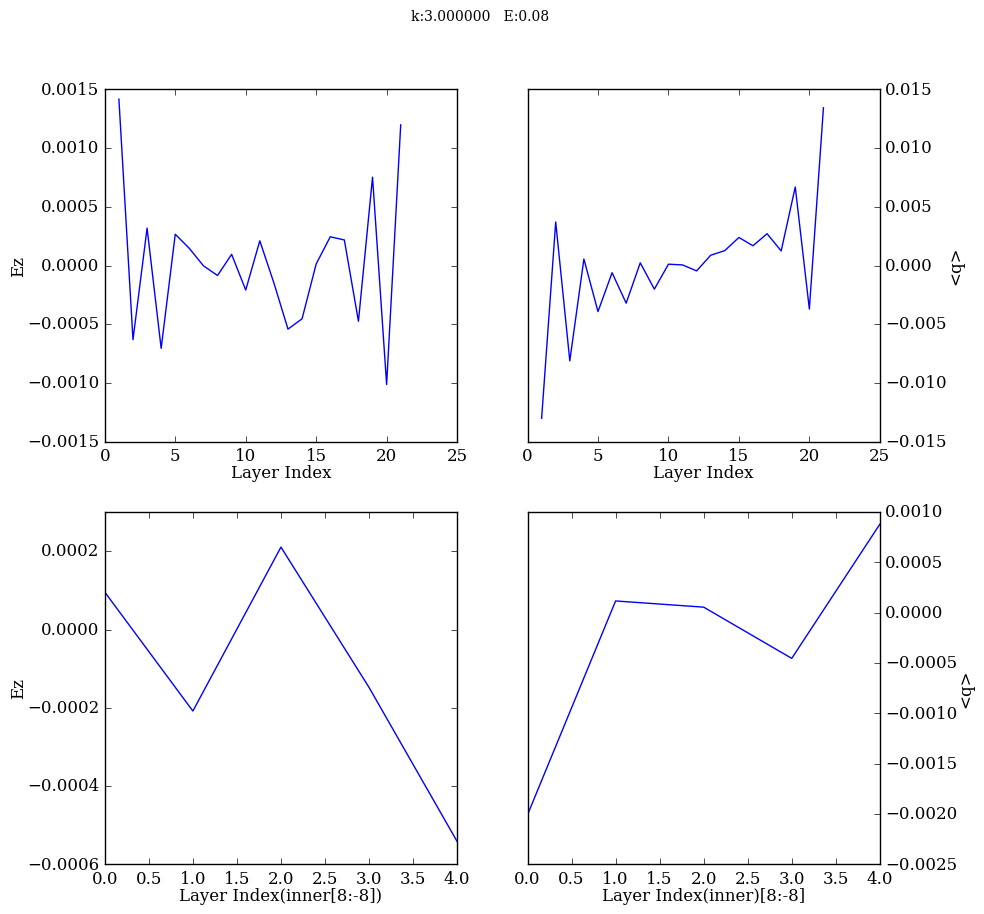

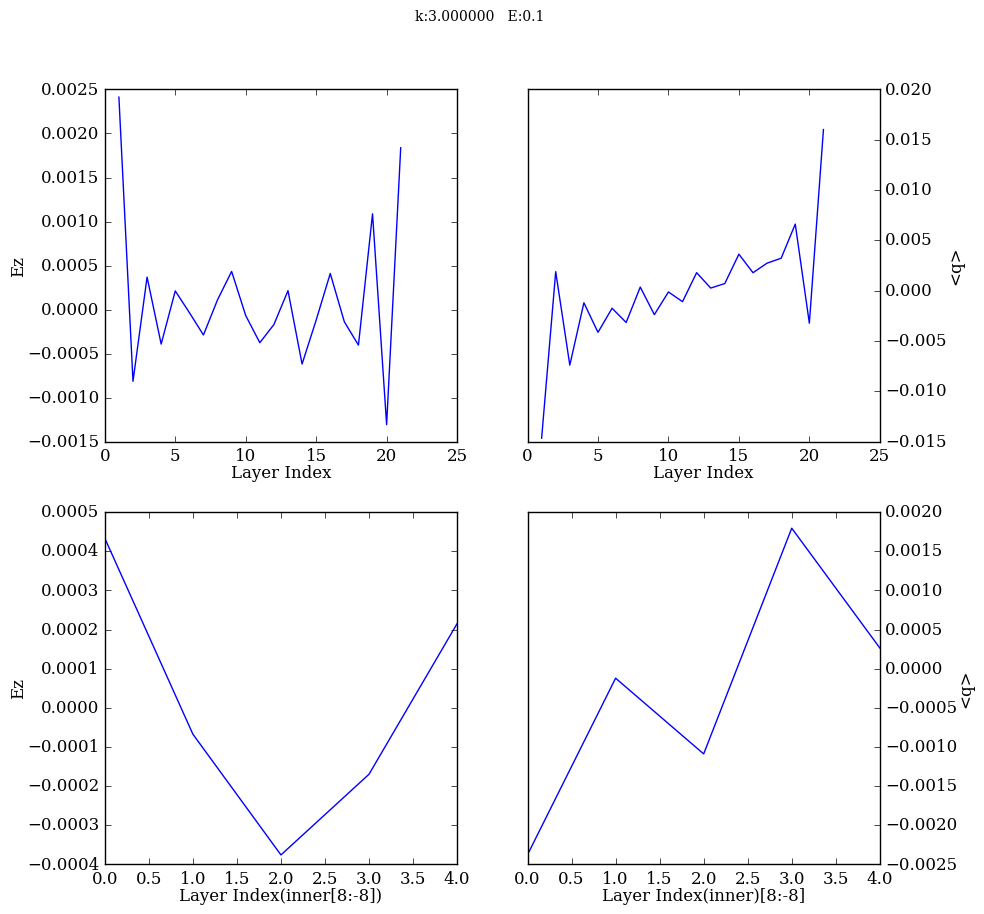

...

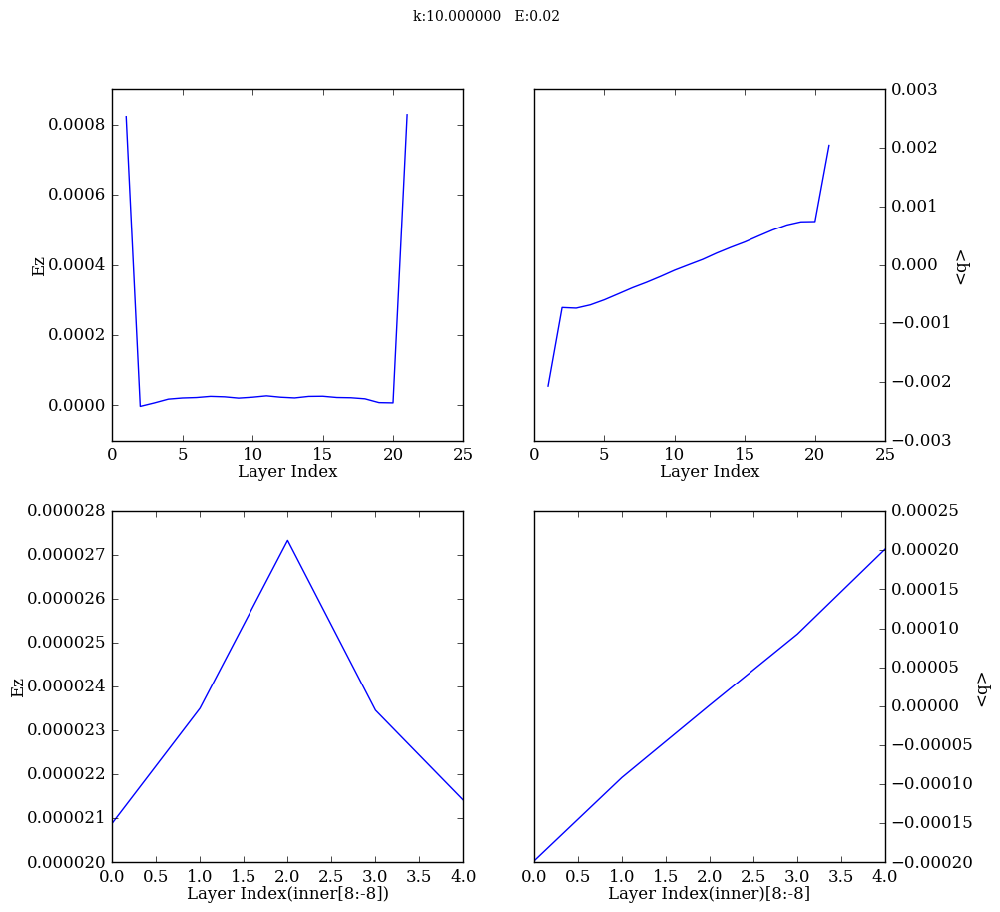

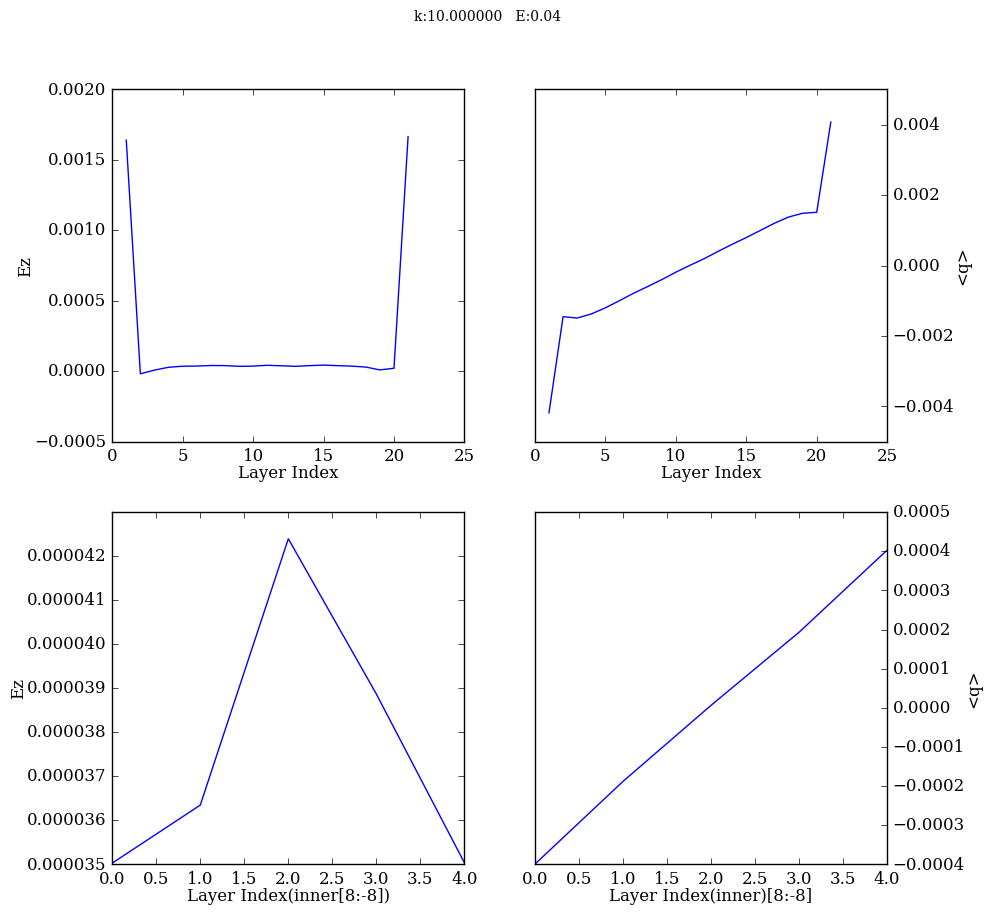

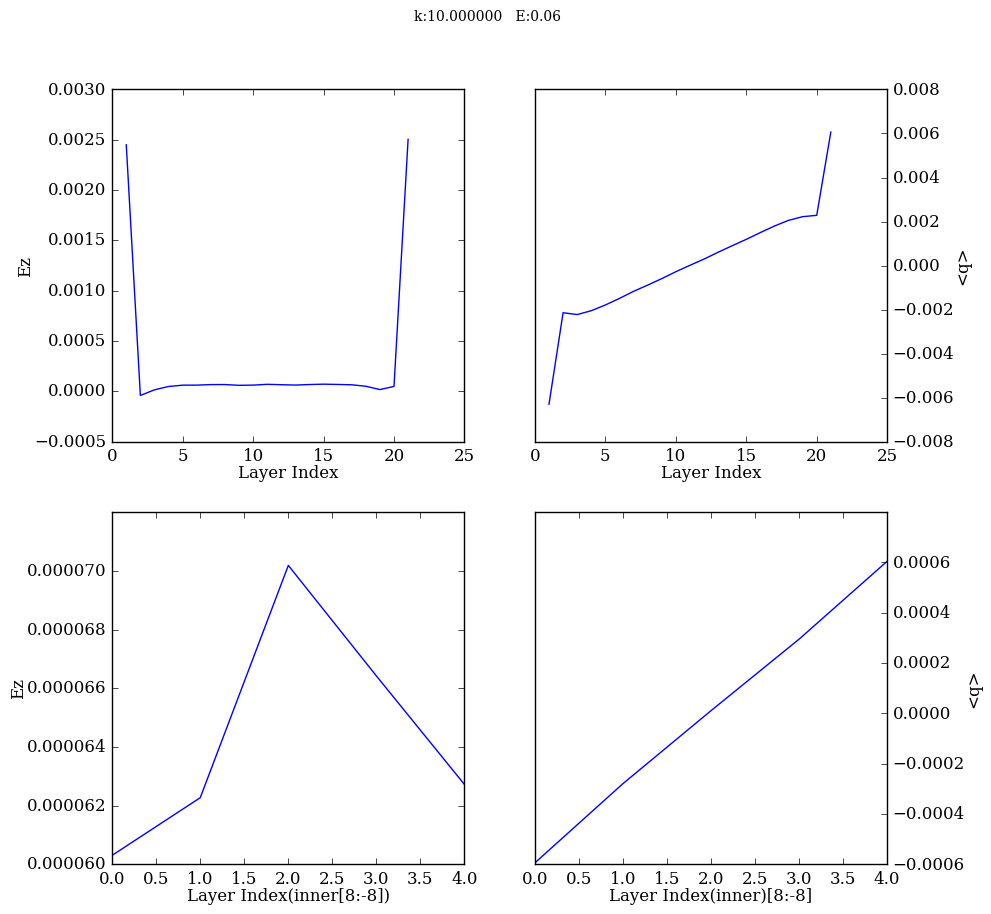

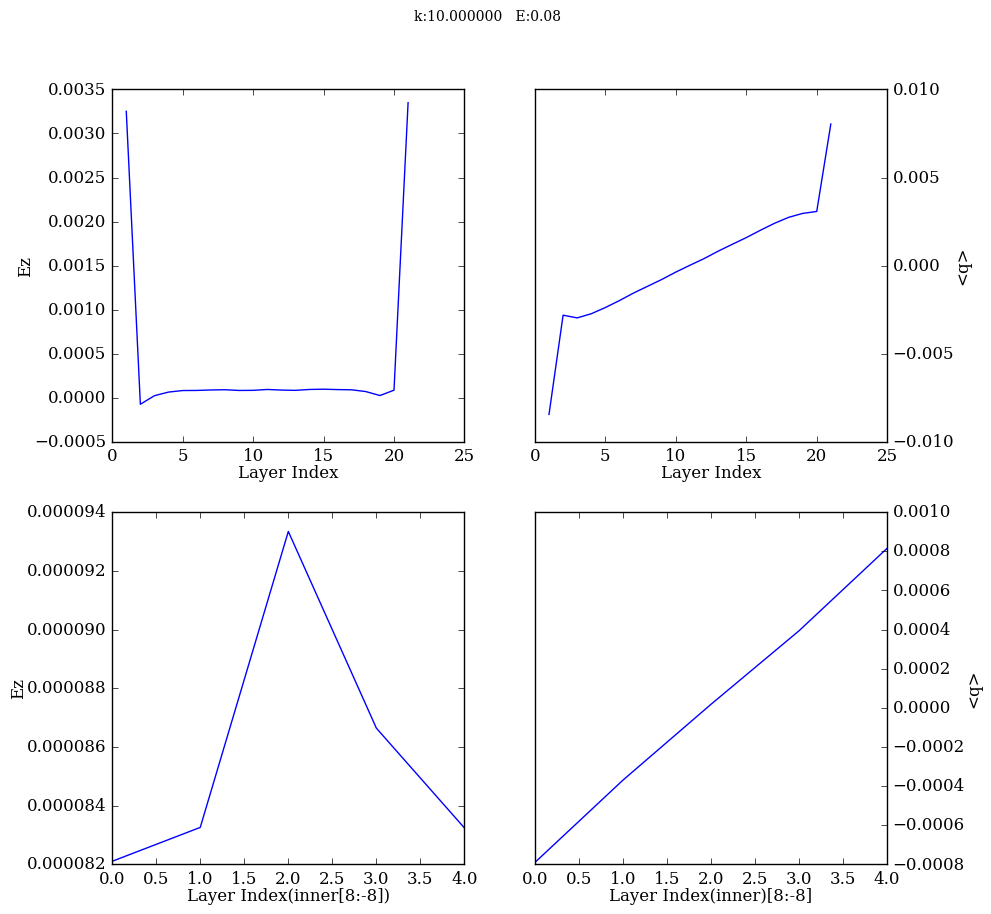

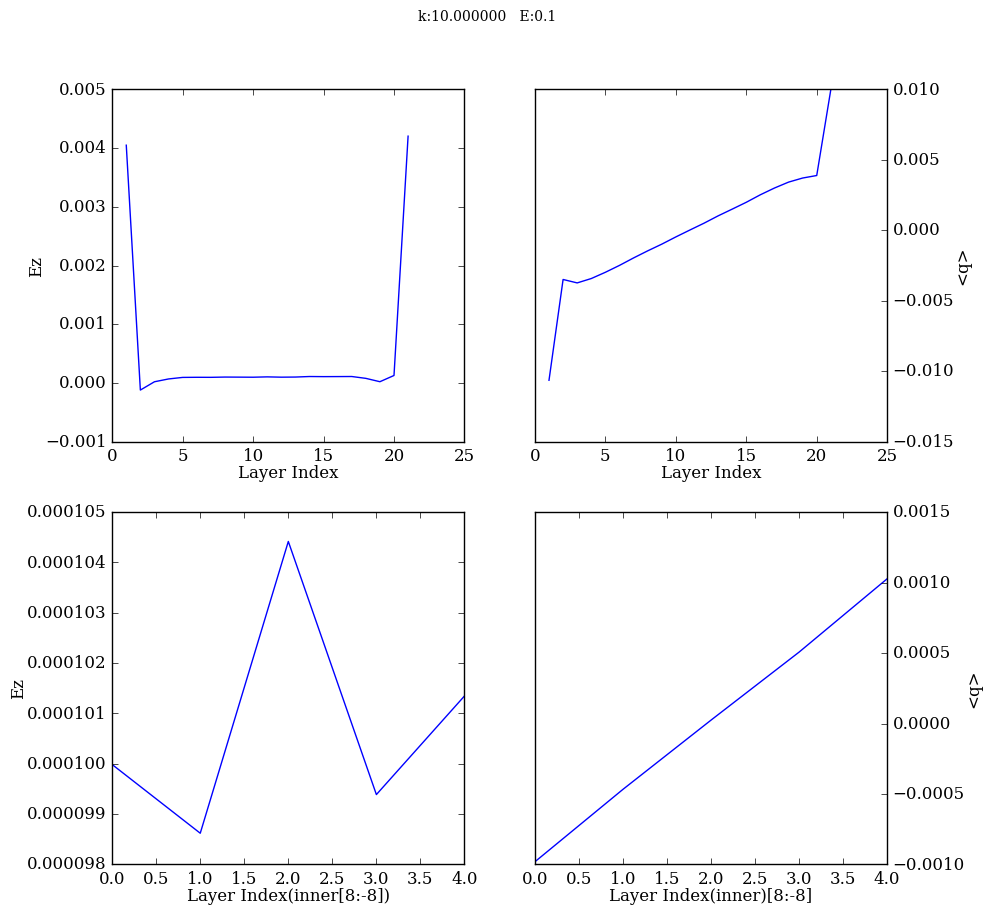

In [91]:
efield=['0.02','0.04','0.06','0.08','0.1']
curvatures=[3,5,7,9,10]
thickness=[21]
nMol={'9':648,'12':864,'15':1080,'18':1296,'21':4032,'24':1728,'27':1944,'30':2160,'33':2376,'36':2592,'39':2808}
frames=100
KET=[[k,e,t] for k in curvatures for e in efield for t in thickness]
innerLayer=4
OutResultDen=[] #list of list i.e [[k,e,dipole],[...],[....]]
OutResultDPole=[]
for info in KET:
    #file="PtSlab111Z"+str(info[2])+'LCO_6'+"K_"+str(info[0])+"E_"+info[1]+".dump"
    file=str(info[2])+'LCO_6'+"K_"+str(info[0])+"E_"+info[1]+".dump"
    try:
        print("Reading: "+"../KTuningPolynomialSelf/Simulation/"+file)
        rawData=feam.DumpExtractor("../KTuningPolynomialSelf/Simulation/"+file,frames,nMol[str(info[2])],0)
        [vx,vy,vz]=rawData["velocity"]
        [x,y,z]=rawData["position"]
        [c,w]=rawData["chargeQV"]
        [ex,ey,ez]=rawData["electricField"]
        [layer,a]=feam.Layers(z,nMol[str(info[2])])
    except:
        print("Error in reading "+"../KTuningPolynomialSelf/Simulation/"+file)
        continue
    eavz=[]
    eavx=[]
    eavy=[]
    chav=[]
    zav=[]
    begin=0
    for counter in range(len(a)):
        eavz.append(num.sum(num.sum(ez[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        chav.append(num.sum(num.sum(c[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavx.append(num.sum(num.sum(ex[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        eavy.append(num.sum(num.sum(ey[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
        zav.append(num.sum(num.sum(z[begin:,layer[counter][0]],axis=1)/len(layer[counter][0]))/(frames-begin))
    eavz=num.array(eavz)/23.0609    #convert to V/ang
    const0=num.polyfit(zav[8:-8],chav[8:-8],1)
    const1=num.polyfit(range(len(chav[8:-8])),chav[8:-8],1)
    const2=num.polyfit(range(len(zav[8:-8])),zav[8:-8],1)
    numberPerLayer=2*len(layer[8][0])
    dz=abs(zav[14]-zav[13])
    
    
    
    dipoleDen=const1[0]*len(layer[8][0])/(A*2)
    dipole=const0*dz*dz/4
    
    
    print("=========K:%d=====E:%f=======T:%d======\n"%(info[0],float(info[1])*1e-1,info[2]))
    print(dipoleDen*1.6e-19,dipole[0]*1.6e-19)
    
    OutResultDen.append([info[0],float(info[1]),dipoleDen*1.6e-19])
    OutResultDPole.append([info[0],float(info[1]),dipole[0]*1.6e-19])
    
    fig=plt.figure(figsize=(10,10),)
    
    ax1=fig.add_subplot(2,2,1)
    ax1.plot(range(1,len(a)+1),eavz)
    ax1.set_xlabel("Layer Index")
    ax1.set_ylabel("Ez")
    
    ax2=fig.add_subplot(2,2,2)
    ax2.plot(range(1,len(a)+1),chav)
    ax2.set_xlabel("Layer Index")
    ax2.set_ylabel("<q>")
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position("right")
    
    
    ax3=fig.add_subplot(2,2,3)
    ax3.plot(eavz[8:-8])
    ax3.set_xlabel("Layer Index(inner[8:-8])")
    ax3.set_ylabel("Ez")
    
    ax4=fig.add_subplot(2,2,4)
    ax4.plot(chav[8:-8])
    ax4.set_xlabel("Layer Index(inner)[8:-8]")
    ax4.set_ylabel("<q>")
    ax4.yaxis.tick_right()
    ax4.yaxis.set_label_position("right")
    
    fig.suptitle('k:%f   E:%s'%(info[0],info[1]))
    plt.draw()
OutResultDen=num.array(OutResultDen)
OutResultDPole=num.array(OutResultDPole)

print("densitywritting")
num.savetxt("../KTuningPolynomialSelf/Results/KEDDensity.out",OutResultDen)
num.savetxt("../KTuningPolynomialSelf/Results/KEDPole.out",OutResultDPole)
     

In [22]:
OutResultDPole

array([[  3.00000000e+00,   2.00000000e-02,  -1.55691274e-23],
       [  3.00000000e+00,   4.00000000e-02,   3.19109322e-23],
       [  3.00000000e+00,   6.00000000e-02,   3.84235937e-23],
       [  3.00000000e+00,   8.00000000e-02,   4.70920828e-23],
       [  3.00000000e+00,   1.00000000e-01,   6.51807512e-23],
       [  5.00000000e+00,   2.00000000e-02,   8.86068421e-24],
       [  5.00000000e+00,   4.00000000e-02,   1.80191057e-23],
       [  5.00000000e+00,   6.00000000e-02,   2.54674457e-23],
       [  5.00000000e+00,   8.00000000e-02,   3.28628744e-23],
       [  5.00000000e+00,   1.00000000e-01,   4.56485465e-23],
       [  7.00000000e+00,   2.00000000e-02,   8.73377127e-24],
       [  7.00000000e+00,   4.00000000e-02,   1.78949902e-23],
       [  7.00000000e+00,   6.00000000e-02,   2.67345476e-23],
       [  7.00000000e+00,   8.00000000e-02,   3.57118713e-23],
       [  7.00000000e+00,   1.00000000e-01,   4.49465768e-23],
       [  9.00000000e+00,   2.00000000e-02,   9.0460794

6.16177822884e-22


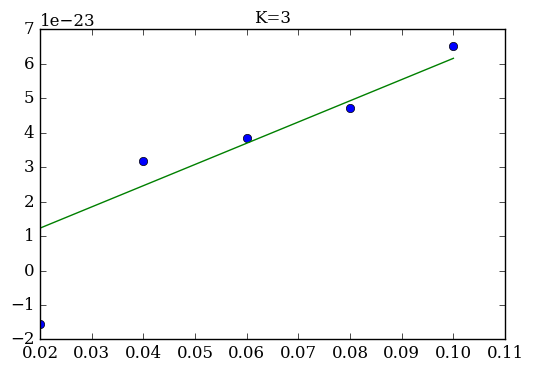

4.37268602627e-22


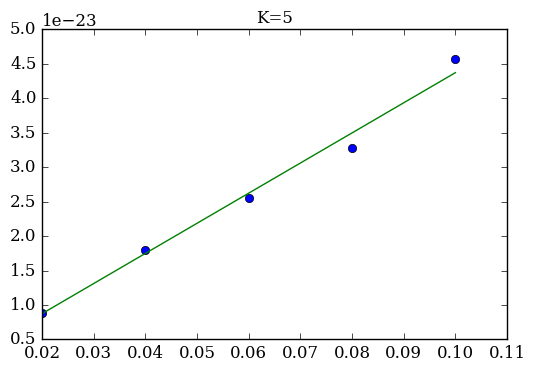

4.4755251221e-22


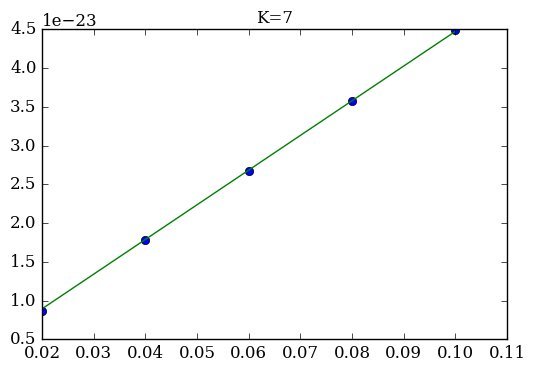

4.53375707871e-22


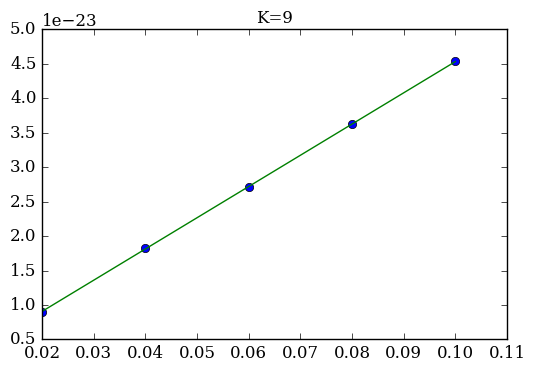

4.50541647966e-22


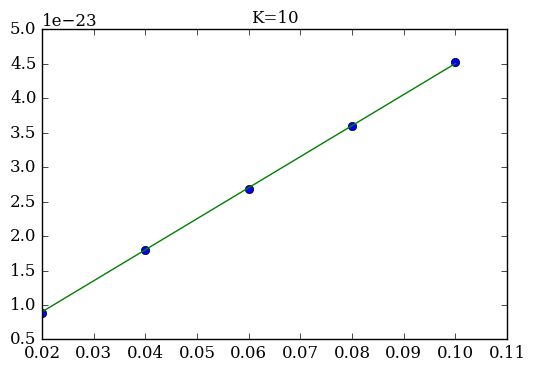

In [97]:
from scipy.optimize import curve_fit
OutResultDPole=num.array(OutResultDPole)
curvatures=[3,5,7,9,10]
slopes1=[]
f=lambda x,a:a*x
for var in curvatures:
    e=OutResultDPole[OutResultDPole[:,0]==var][:,1]
    p=OutResultDPole[OutResultDPole[:,0]==var][:,2]
    param=curve_fit(f,e,p)
    a=param[0][0]
    print(a)
    slopes1.append(a)
    lab.title("K=%d"%(var))
    lab.plot(e,p,'o')
    lab.plot(e,f(a,e))
    lab.show()

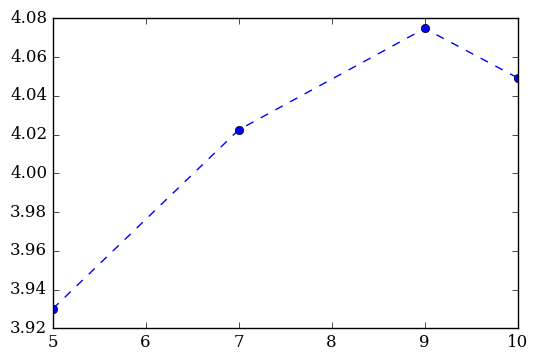

In [98]:
slopes1=num.array(slopes1)/(4*num.pi*8.854e-22)*100
lab.plot(curvatures[1:],slopes1[1:],'o--')
#lab.axhline(y=44,color='red',linestyle='--')


In [48]:
slopes1

array([ 0.52840293,  0.43085313,  0.3756188 ,  0.29369783,  0.29207579,
        0.28682353,  0.27351009,  0.26557788])